# Task 2: Clustering

## Subtask 1: Generate data

In [1]:
import numpy as np
from sklearn.datasets import make_blobs
import random
from random import randint
import copy


n_samples = 1500
random_state = 170
transformation = [[0.60834549, -0.63667341], [-0.40887718, 0.85253229]]

X, y = make_blobs(n_samples=n_samples, random_state=random_state)
X_aniso = np.dot(X, transformation) # Anisotropic blobs
X_varied, y_varied = make_blobs(n_samples=n_samples, cluster_std=[1.0, 2.5, 0.5], random_state=random_state)
X_filtered = np.vstack((X[y == 0][:500], X[y == 1][:100], X[y == 2][:10])) # Unevenly sized blobs
y_filtered = [0] * 500 + [1] * 100 + [2] * 10

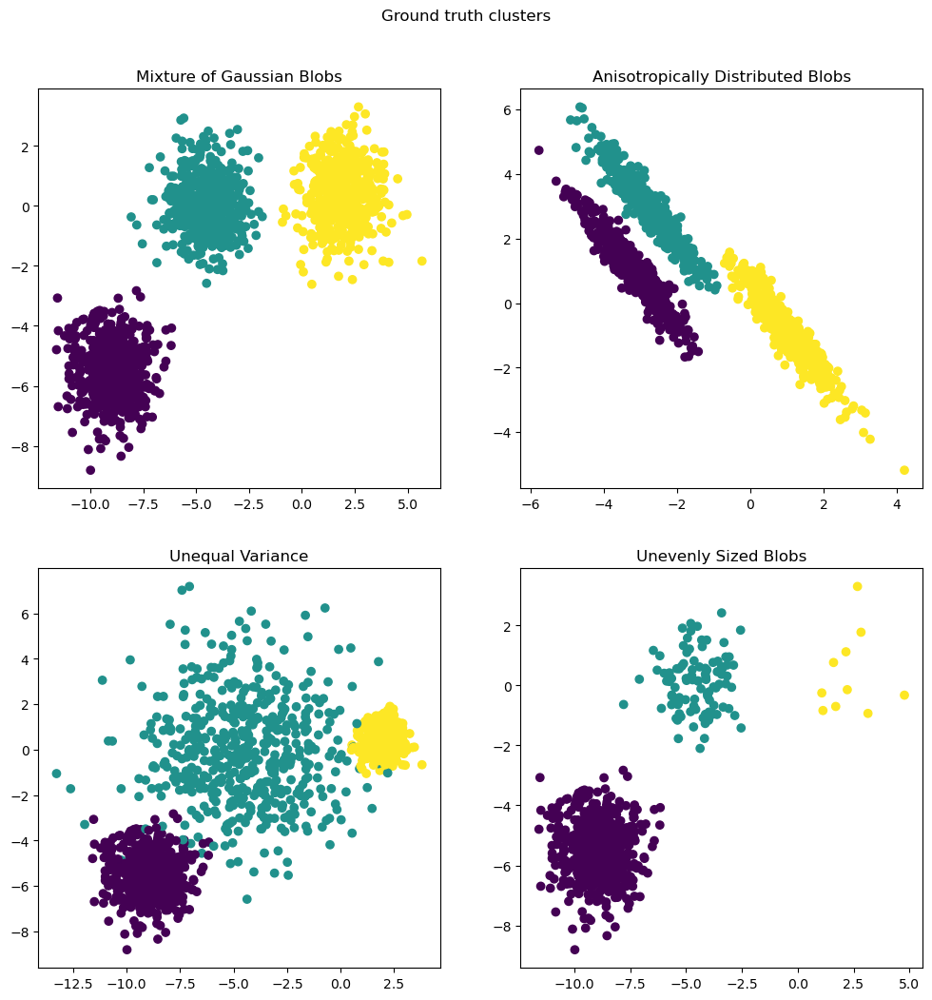

In [2]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))

axs[0, 0].scatter(X[:, 0], X[:, 1], c=y)
axs[0, 0].set_title("Mixture of Gaussian Blobs")

axs[0, 1].scatter(X_aniso[:, 0], X_aniso[:, 1], c=y)
axs[0, 1].set_title("Anisotropically Distributed Blobs")

axs[1, 0].scatter(X_varied[:, 0], X_varied[:, 1], c=y_varied)
axs[1, 0].set_title("Unequal Variance")

axs[1, 1].scatter(X_filtered[:, 0], X_filtered[:, 1], c=y_filtered)
axs[1, 1].set_title("Unevenly Sized Blobs")

plt.suptitle("Ground truth clusters").set_y(0.95)
plt.show()

## Subtask 2: Lloyd's algorithm

In [3]:
#randomly pics a given amount of centers from datapoints. 
#if k++ is true dan the points who are farther away from the closest center are more likely
def getCenters(x,y, numberCenters, kpp = False):
    indexAll = (np.array(range(0, x.shape[0])))
    centers = []
    # if k++ is not selected all the weights are 1 and every point is equally likely
    weigths = np.ones(x.shape[0], dtype = int)
    for i in range(numberCenters):
        # if k++ is selected then the squared distance to the closest center will be assigned
        #as a wight to make a point, farther away more likely to be picked.
        if (centers != [] and kpp):
            for i in range(x.shape[0]):
                closestsCenterIndex, minDistance  = closest(np.asarray(centers), x[i], y[i])
                weigths[i] = minDistance**2
        #assign random centers        
        index = int(random.choices(indexAll, weights = weigths,  k = 1)[0])
        center = [x[index], y[index]]
        centers.append(center)
    return centers

#finds the cluster centers
def newCenters(orientations, numberCenters):
    centers = []
    #find avg of points orientated to center
    for i in range(numberCenters):
        points = np.asarray(orientations[i])
        xAvg = np.average(points[:,0])
        yAvg = np.average(points[:,1])
        centers.append([xAvg,yAvg])
    return np.asarray(centers)

In [4]:
#find the closes center to a data point
def closest(centers, x, y):
    #calculet distances between point and every center
    centersReduced = centers-[x,y] 
    distances = np.sqrt(centersReduced[:,0]**2+centersReduced[:,1]**2)
    #get index of minimum
    Min = min(distances)
    indexMin = [i for i, j in enumerate(distances) if j == Min] 
    return indexMin[0], Min
    
#sorts datapoints ist list. Each List consists of the data points that are the closest to the center
def findOrientations(x, y, centers):
    orientations = [None]*centers.shape[0]
    #iterate over all datapoints
    for i in range(x.shape[0]):
        #find the closest center to each data point
        index, MinDistance = closest(centers, x[i], y[i])
        #save Datapoints in list the centers
        if orientations[index]==None:
            orientations[index] = [[x[i], y[i]]]
        else:
            orientations[index].append([x[i], y[i]])
    return orientations

#calculationg the objective k mean 
def kMeansObjective(orientations, centers):
    res = []
    for index, center in enumerate(centers):
        meanByCenter = 0
        for eachDatapoint in orientations[index]:
            meanByCenter += np.sqrt((center[0]-eachDatapoint[0])**2+(center[1]-eachDatapoint[1])**2)
        res.append(meanByCenter/np.asarray(orientations[0]).shape[0])
    return np.average(np.asarray(res))


#performes the LL algorithm for given Dataset an Centers
def lloyd(centers, x, y, datasetName):
    
    #write a list of points closest to centers
    orientations = findOrientations(x, y, centers)
    objectiv = kMeansObjective(orientations, centers)
    
    for i in range(centers.shape[0]):
        #check for centers with no close points
        if orientations[i] == None:
            #if empty pic random new Center
            print("INFO:: New Center is set because no close Points")
            centers[i] = getCenters(x,y, 1)[0]
            return centers
        
    #plot which points belong to which centers
    for i in range(centers.shape[0]):
        points = np.asarray(orientations[i])
        plt.scatter(points[:, 0], points[:, 1], c = colors[i], label = "Datapoints")
        plt.suptitle(str(centers.shape[0]) + " Centers on "+str(datasetName)+" Dataset").set_y(0.95)
    plt.scatter(centers[:,0], centers[:,1], c = colors[centers.shape[0]+1],marker = "^", label = "Center")
    plt.legend()
    plt.show()
    #set new centers to the middle of the closes datapoints
    return newCenters(orientations, centers.shape[0]),  objectiv





In [5]:
#Iterates over every possible amount of centers. Calles Lloyd algorithm to find the centers of Data and compares the 
#center position to the last one
def LloydForAllCenters(X, maxNumberCenters, datasetName, kpp = False):
    centers = []
    objectivs = []
    pltCenters = [[None]] * (maxNumberCenters + 1 )
    #iteration up to the maximal given amount of centers
    for numberCenters in range(1,maxNumberCenters +1):
        
        #determen the centers either random or with k++
        centers = np.asarray(getCenters(X[:, 0], X[:, 1], numberCenters, kpp))

        for i in range(100): #100 is a stoppage criterium
            oldCenters = copy.copy(centers)
            #calling Lloyd algorithm
            centers, objectiv = lloyd(centers, X[:, 0], X[:, 1], datasetName)
            #calculation differences in center position 
            pltCenters[numberCenters].append(plt)
            print("Difference of center to last run: "+ str(np.sum(abs(oldCenters- centers))))
            if abs(np.sum(abs(oldCenters- centers))) <= 0.5 :
                print(str(i) + " IterationSteps untl convertion")
                objectivs.append(objectiv)
                break
                
    


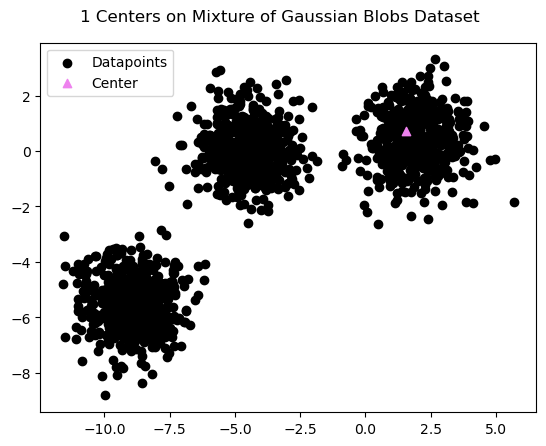

Difference of center to last run: 7.848407229778568


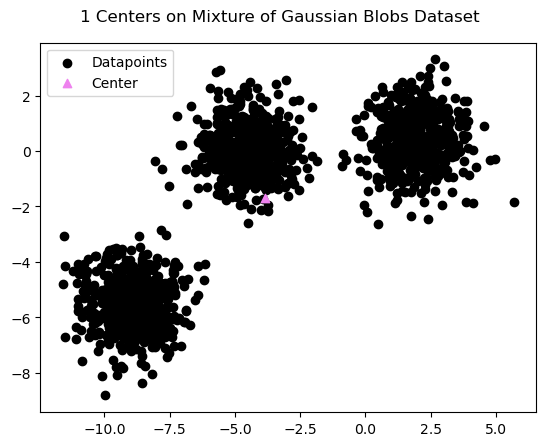

Difference of center to last run: 0.0
1 IterationSteps untl convertion


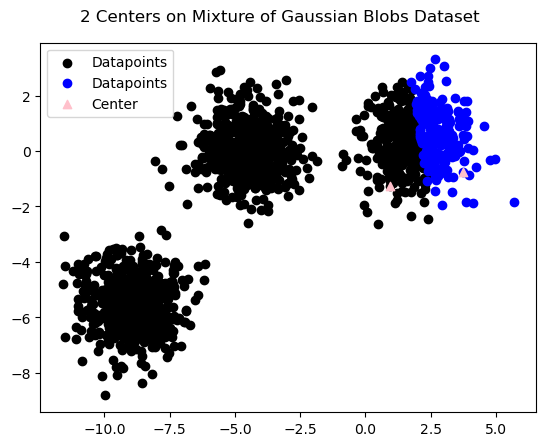

Difference of center to last run: 8.796353270750707


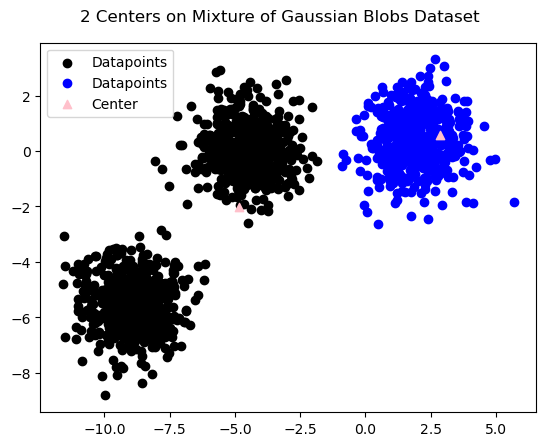

Difference of center to last run: 3.73495808094378


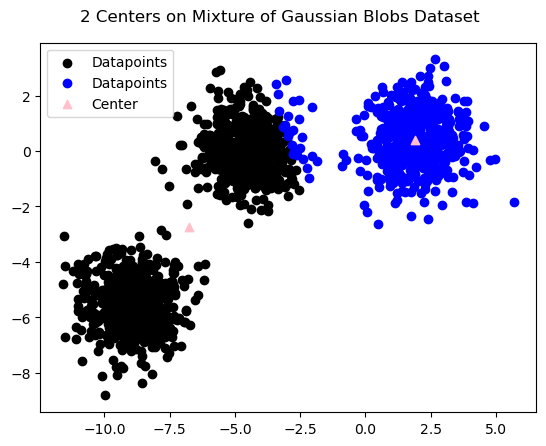

Difference of center to last run: 0.443748332303937
2 IterationSteps untl convertion


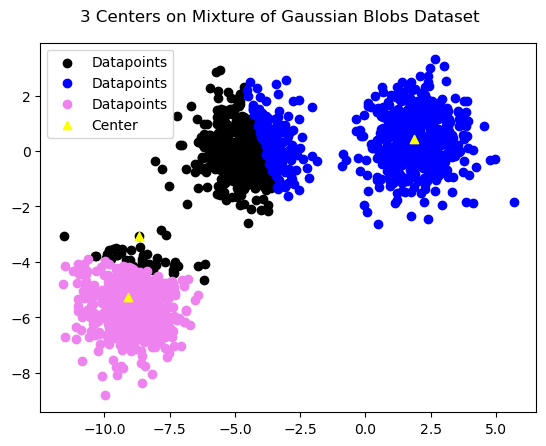

Difference of center to last run: 7.411641113971942


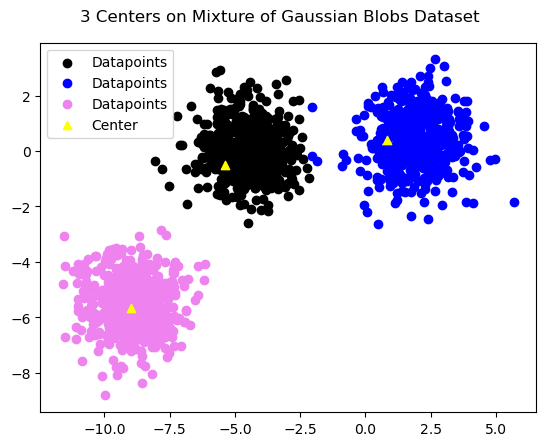

Difference of center to last run: 2.6195169024838068


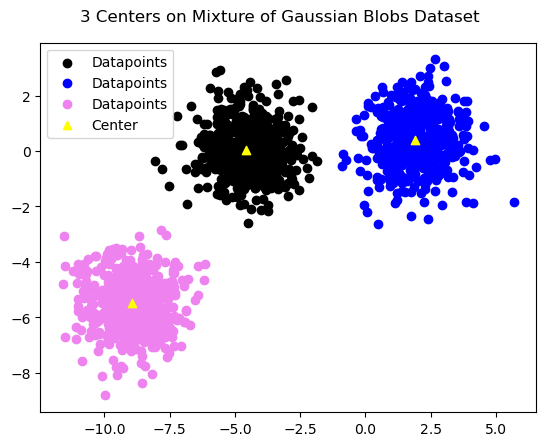

Difference of center to last run: 0.04102590677488575
2 IterationSteps untl convertion


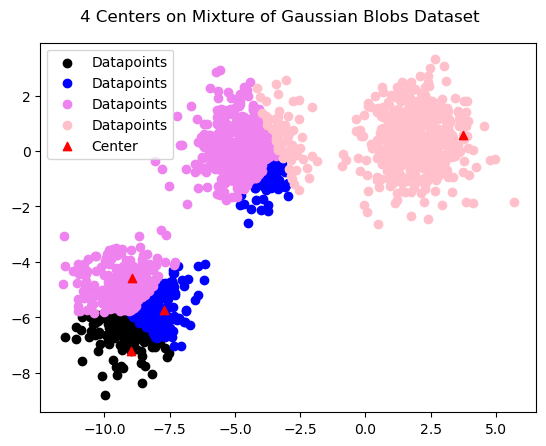

Difference of center to last run: 11.094100417706677


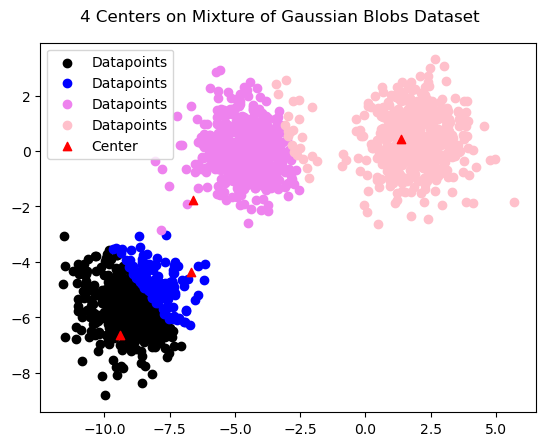

Difference of center to last run: 6.742191222526374


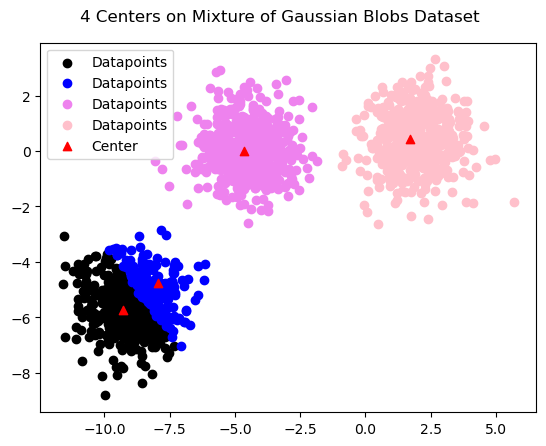

Difference of center to last run: 0.7764076486055467


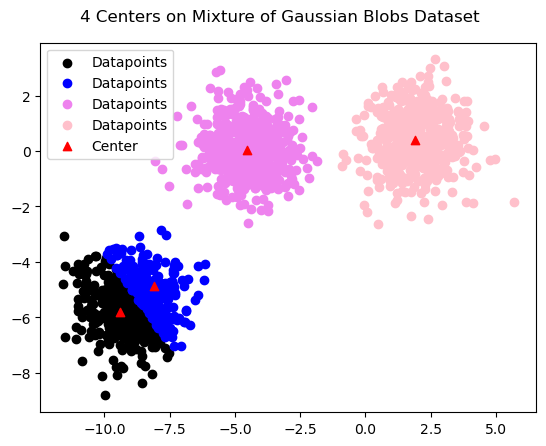

Difference of center to last run: 0.342747761645267
3 IterationSteps untl convertion


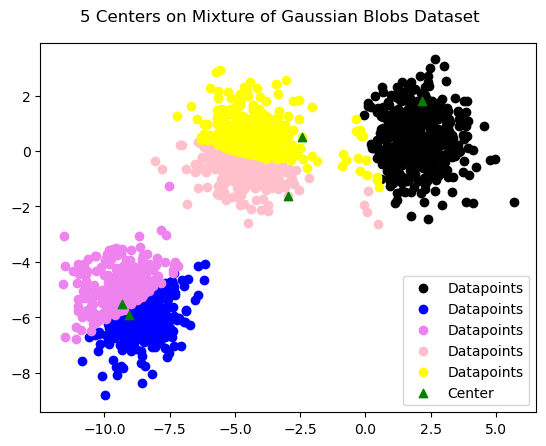

Difference of center to last run: 7.475075662078612


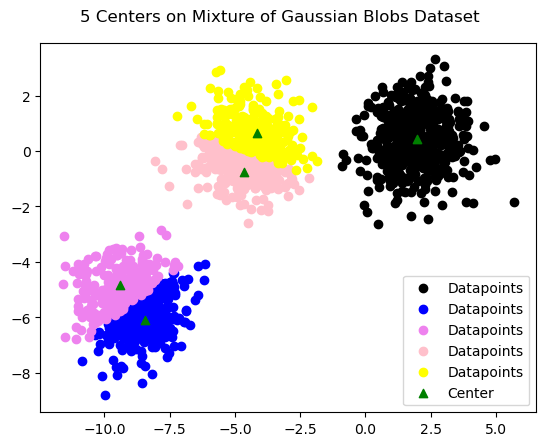

Difference of center to last run: 0.7036736865459228


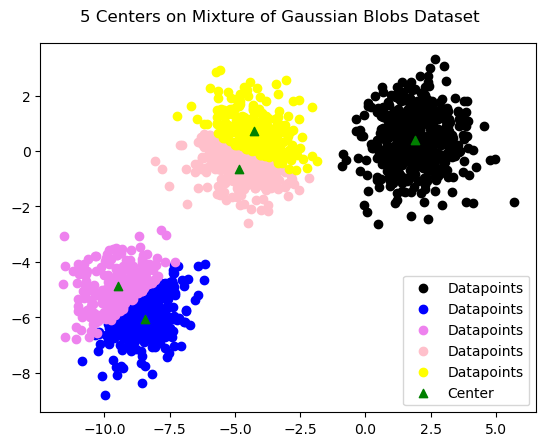

Difference of center to last run: 0.2497141346905215
2 IterationSteps untl convertion


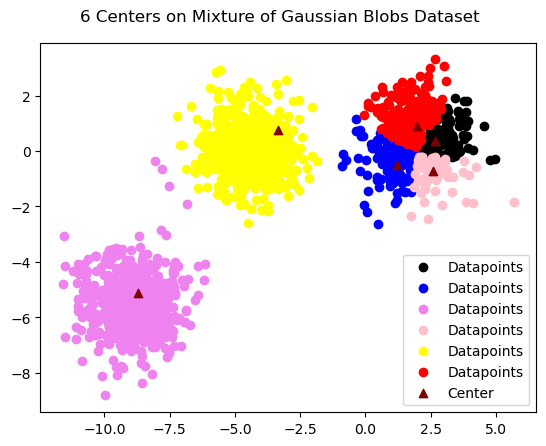

Difference of center to last run: 4.086254809647449


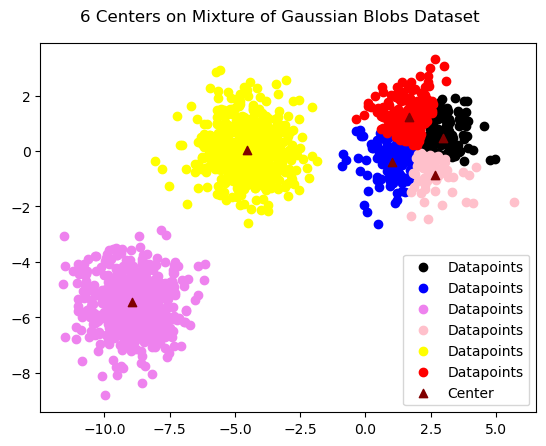

Difference of center to last run: 0.4768203885878005
1 IterationSteps untl convertion


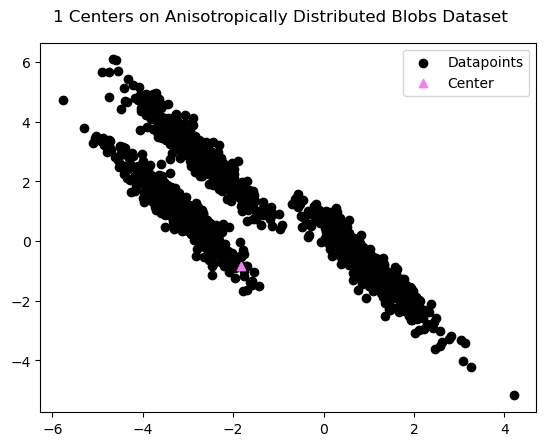

Difference of center to last run: 2.0336383681054926


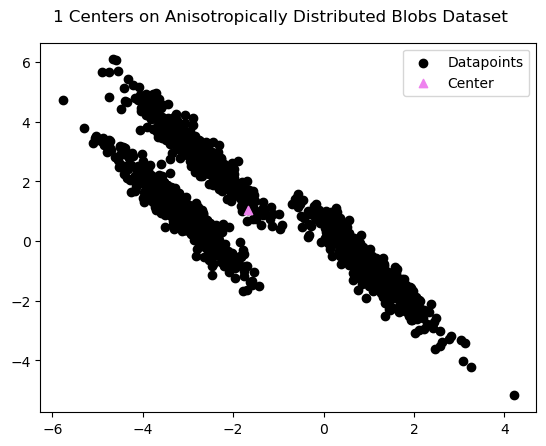

Difference of center to last run: 0.0
1 IterationSteps untl convertion


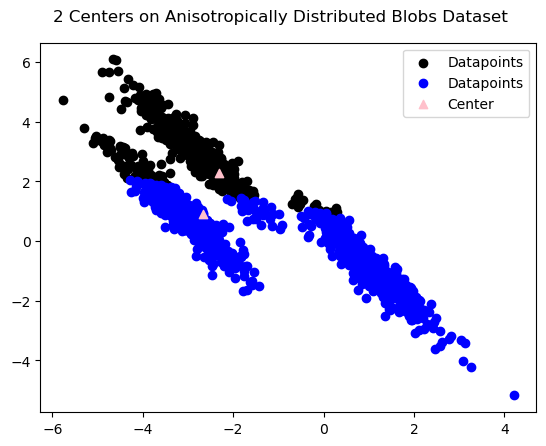

Difference of center to last run: 4.277456336356833


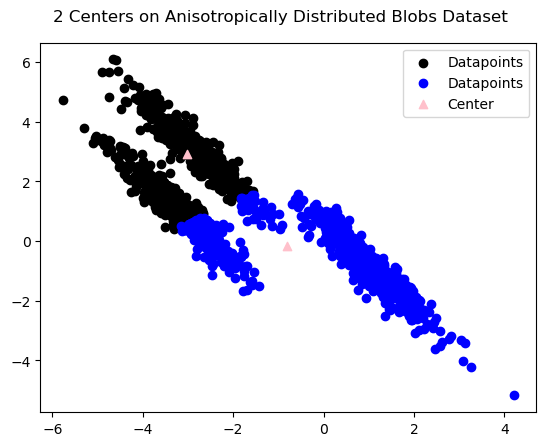

Difference of center to last run: 1.7968162638077638


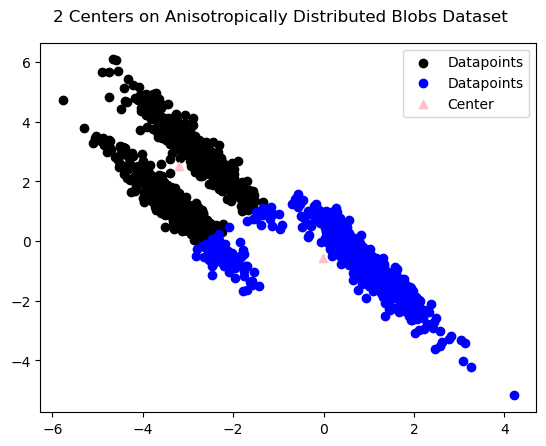

Difference of center to last run: 1.0399130357989232


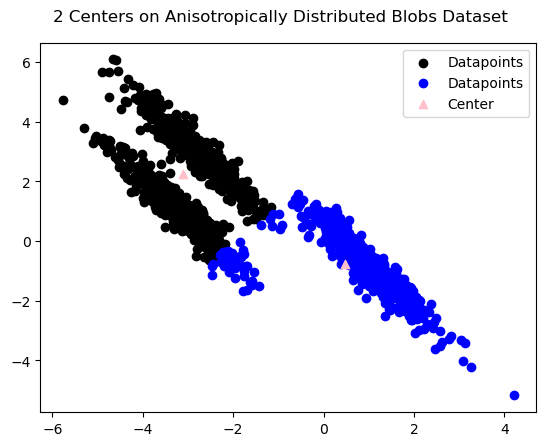

Difference of center to last run: 0.48842276542087326
3 IterationSteps untl convertion


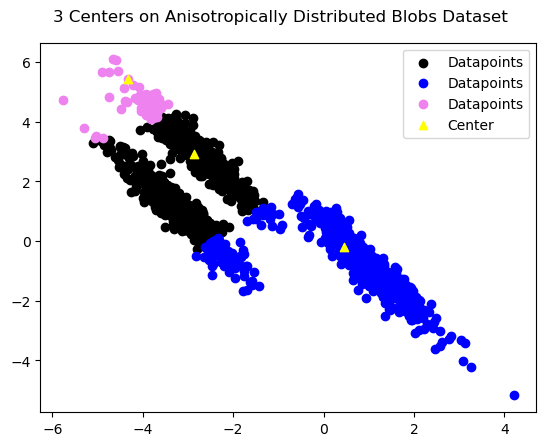

Difference of center to last run: 2.721534256580345


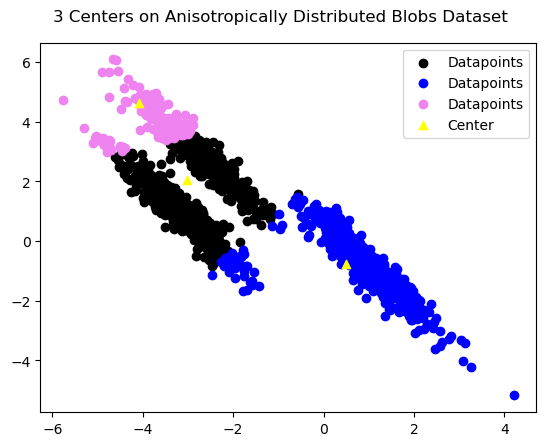

Difference of center to last run: 1.7477694702149562


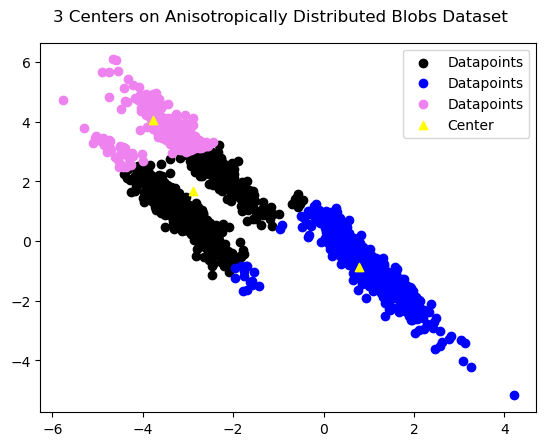

Difference of center to last run: 1.1302867878547862


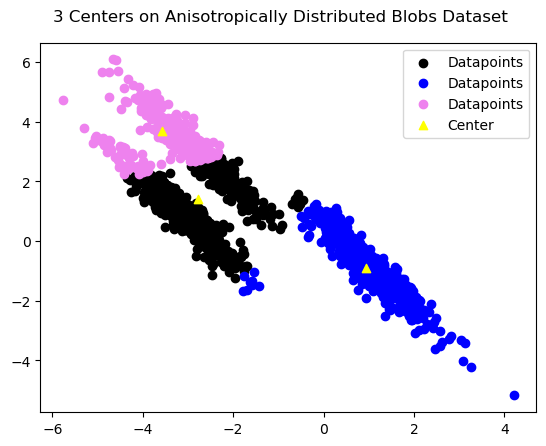

Difference of center to last run: 0.6427985854108798


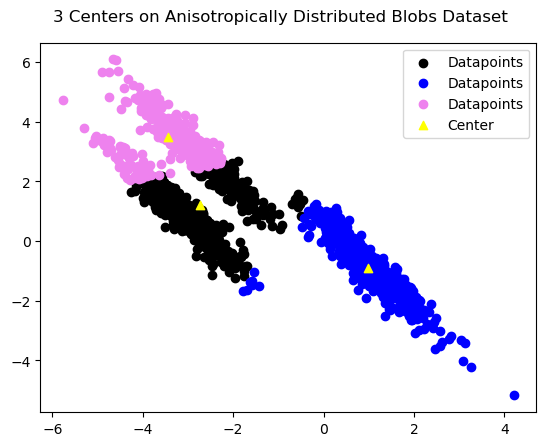

Difference of center to last run: 0.32302989397043036
4 IterationSteps untl convertion


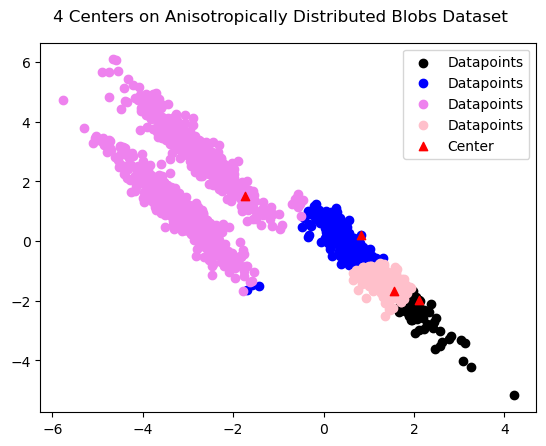

Difference of center to last run: 3.607324215494528


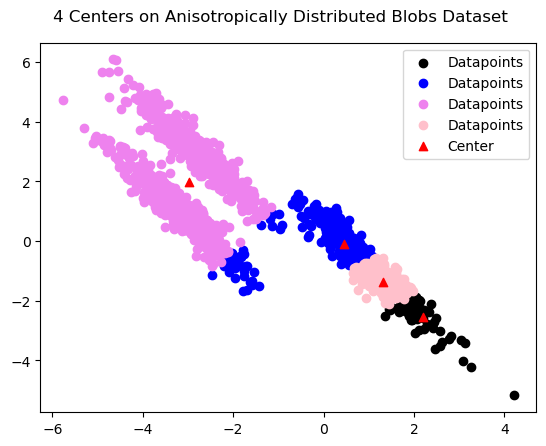

Difference of center to last run: 0.82925457638427


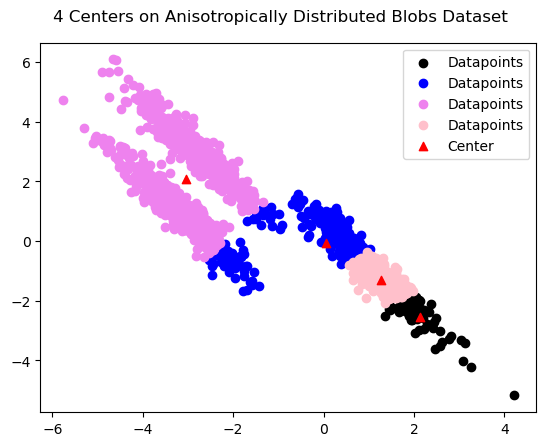

Difference of center to last run: 0.7314067344020947


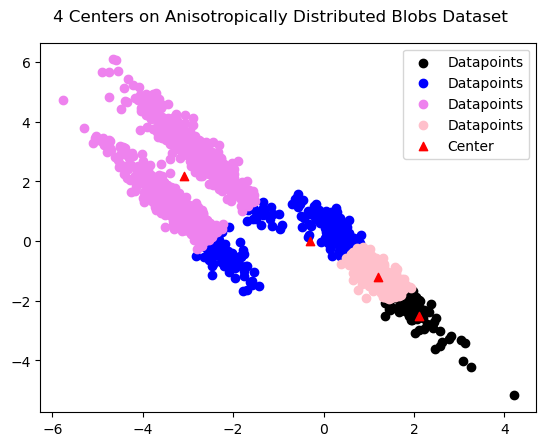

Difference of center to last run: 0.9187439837255509


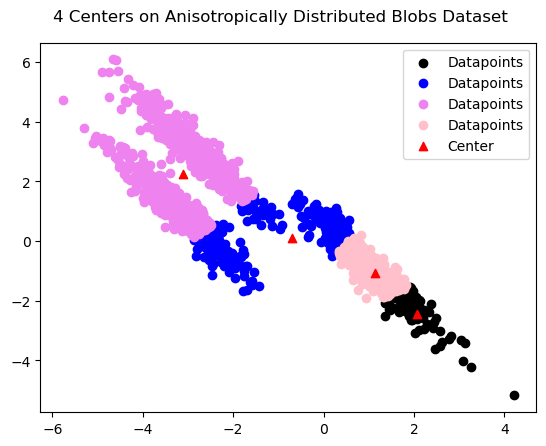

Difference of center to last run: 1.09940877689771


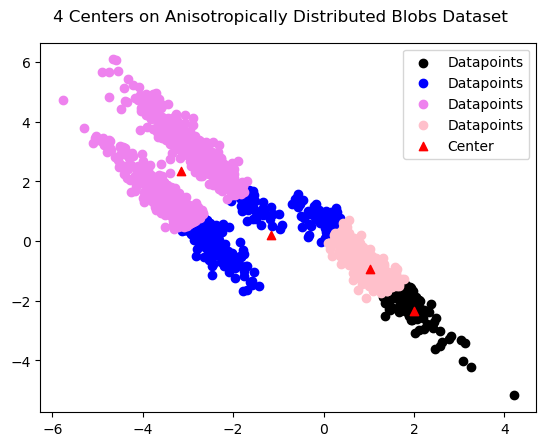

Difference of center to last run: 1.353395248025812


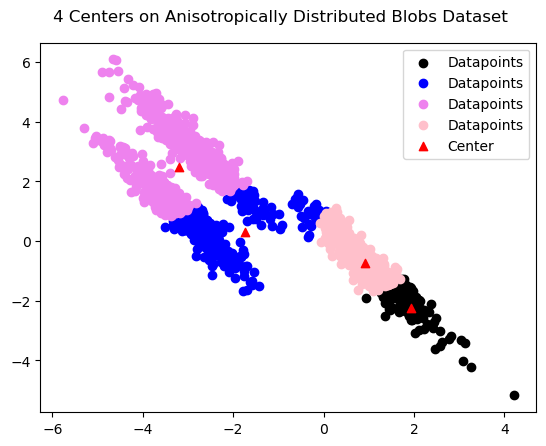

Difference of center to last run: 1.3627753028255967


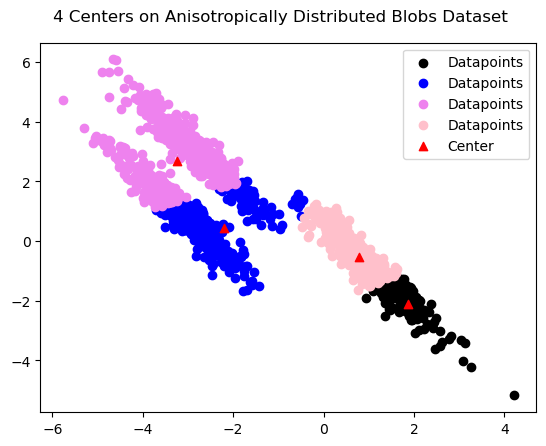

Difference of center to last run: 0.9937664401613354


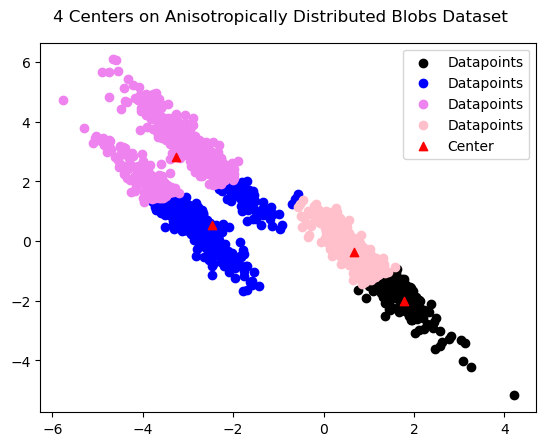

Difference of center to last run: 0.7346394770289463


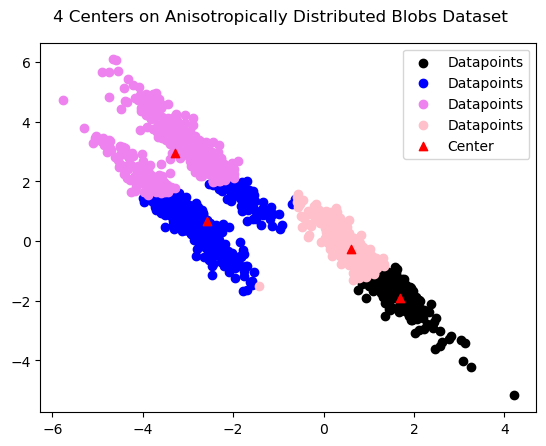

Difference of center to last run: 0.5231895453472635


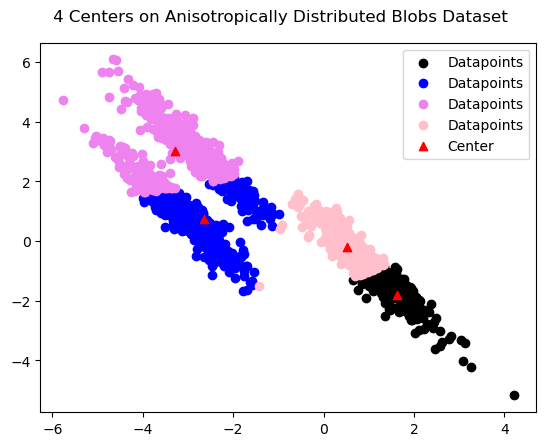

Difference of center to last run: 0.27512021454492475
10 IterationSteps untl convertion


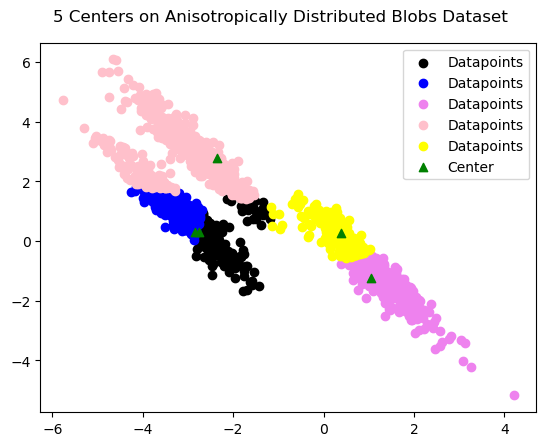

Difference of center to last run: 3.62992848759907


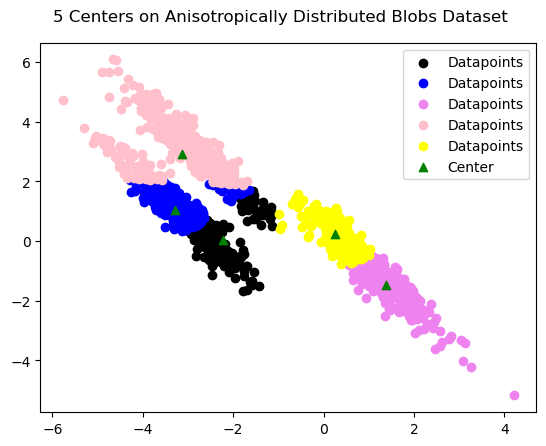

Difference of center to last run: 0.9525024564887776


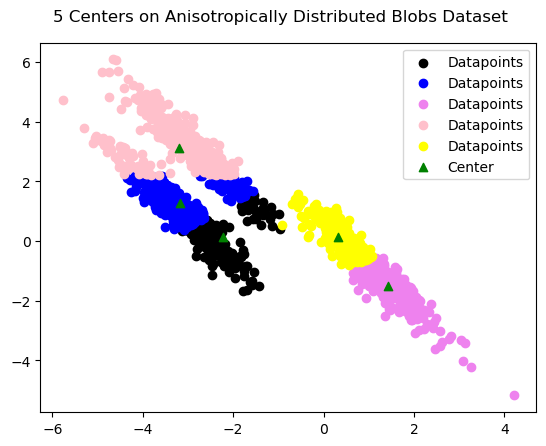

Difference of center to last run: 0.6779325223359756


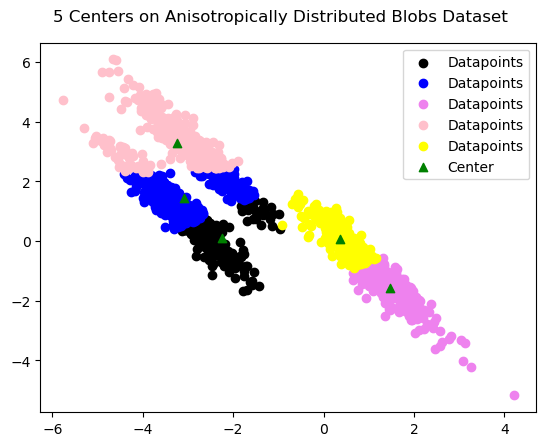

Difference of center to last run: 0.6210415164189649


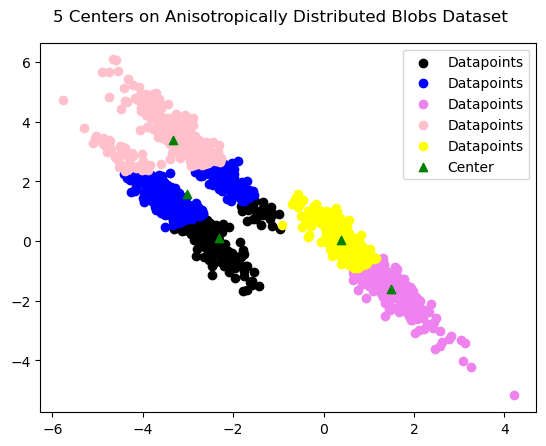

Difference of center to last run: 0.3859252294966289
4 IterationSteps untl convertion


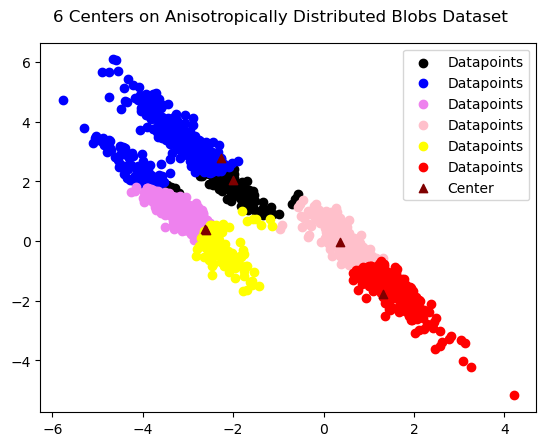

Difference of center to last run: 4.567691978490783


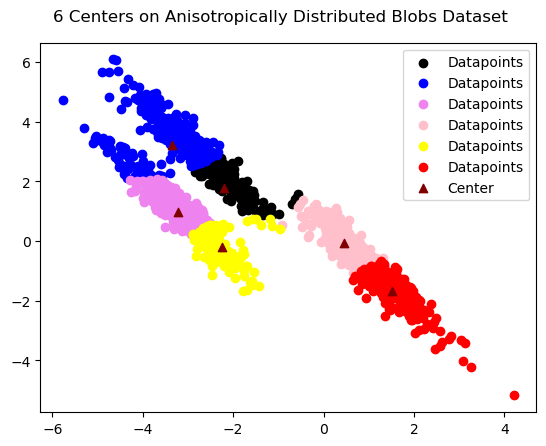

Difference of center to last run: 1.1172154536874328


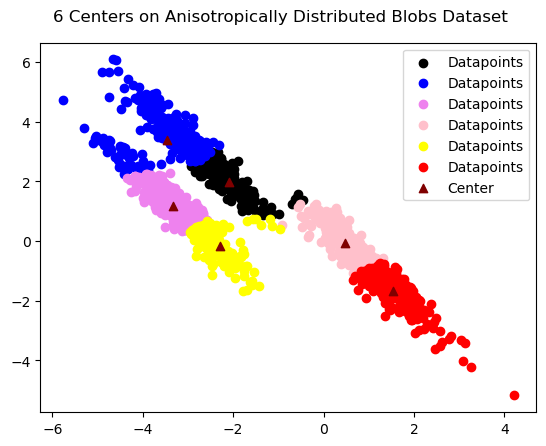

Difference of center to last run: 0.5669041092603543


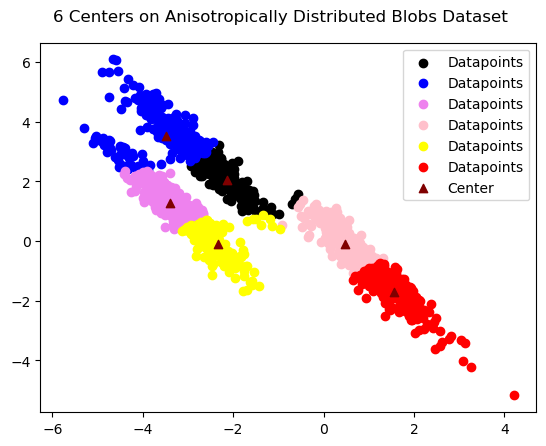

Difference of center to last run: 0.40166972469701007
3 IterationSteps untl convertion


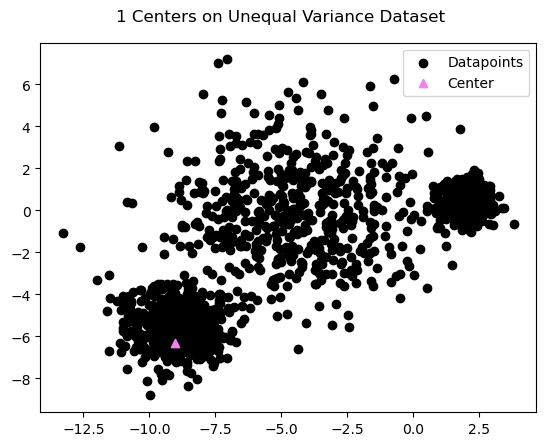

Difference of center to last run: 9.827791807502674


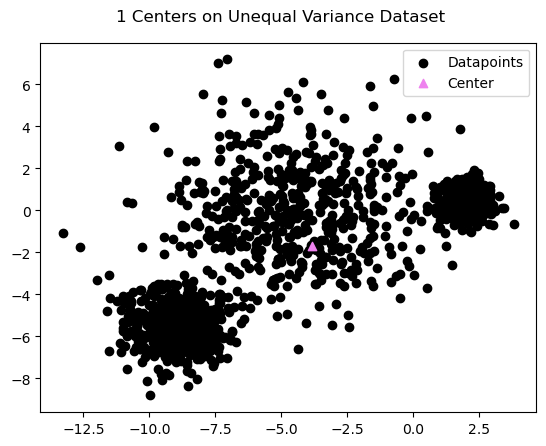

Difference of center to last run: 0.0
1 IterationSteps untl convertion


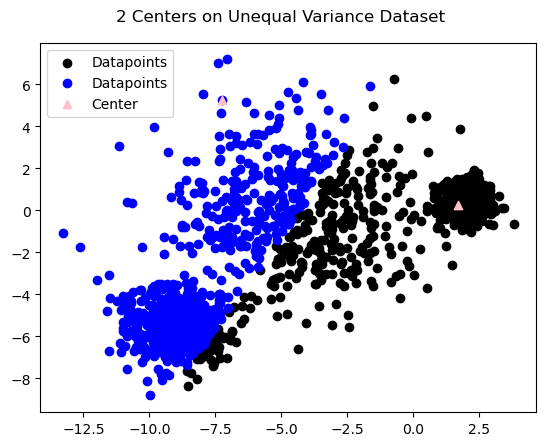

Difference of center to last run: 11.40412865841963


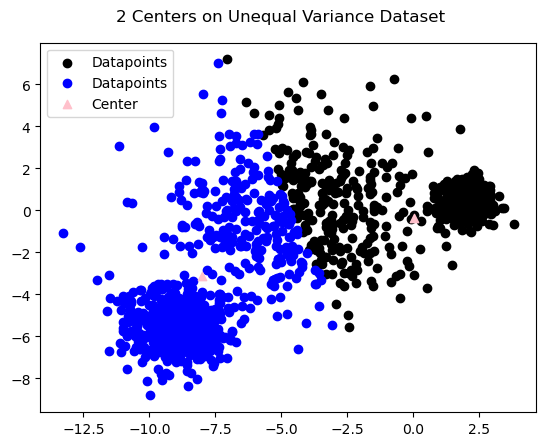

Difference of center to last run: 2.03008838061972


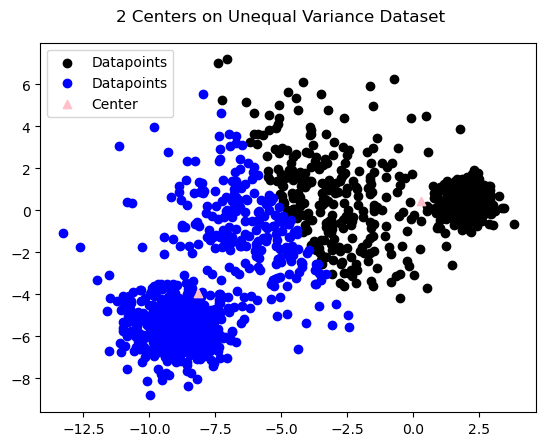

Difference of center to last run: 0.3152699941776046
2 IterationSteps untl convertion


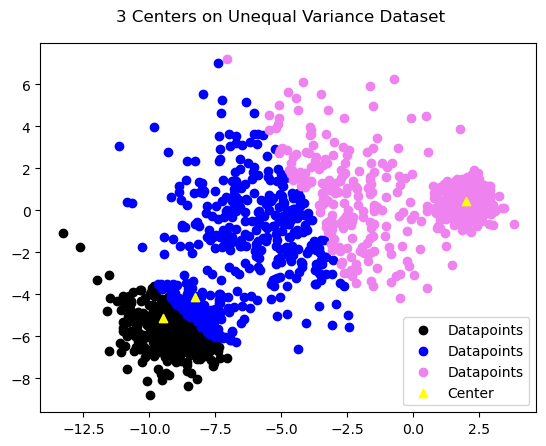

Difference of center to last run: 6.035219224788873


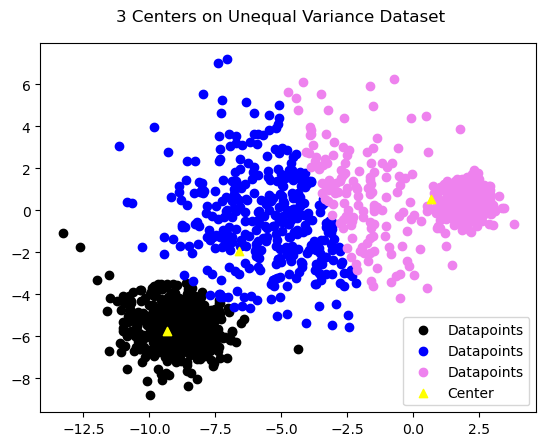

Difference of center to last run: 3.4627030811943245


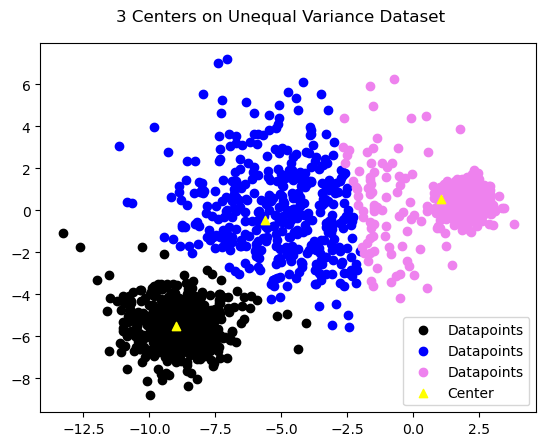

Difference of center to last run: 1.6649999371365403


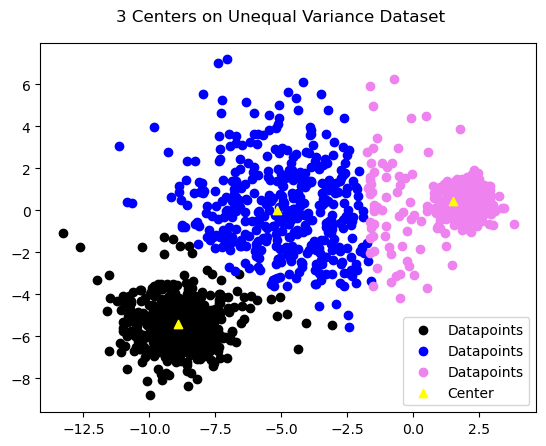

Difference of center to last run: 0.4596948419011673
3 IterationSteps untl convertion


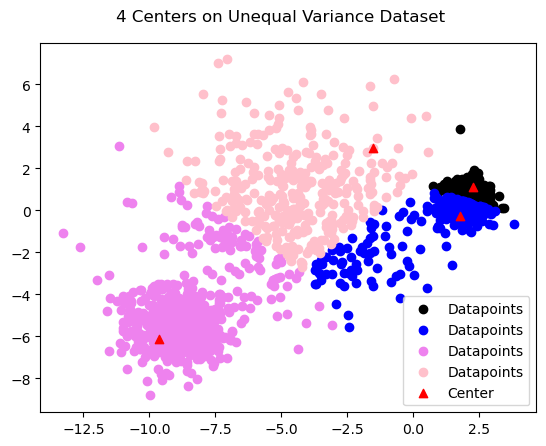

Difference of center to last run: 8.51605609796502


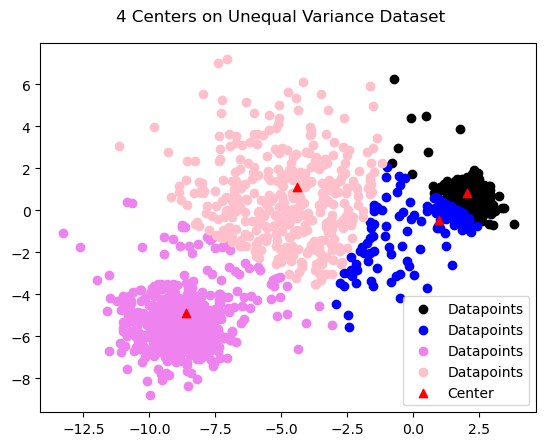

Difference of center to last run: 2.590123481741861


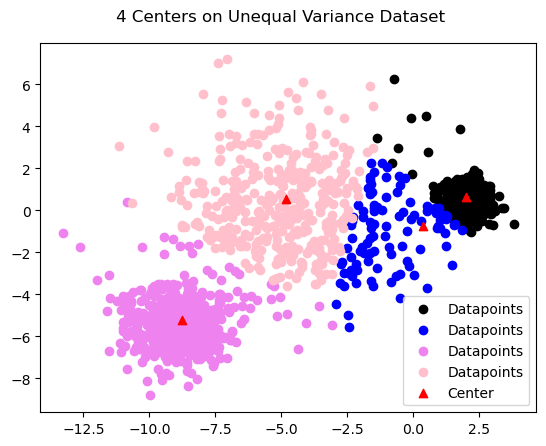

Difference of center to last run: 2.305609059828064


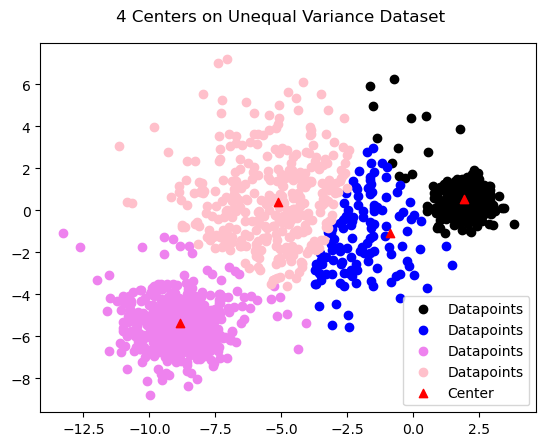

Difference of center to last run: 1.8642638124132773


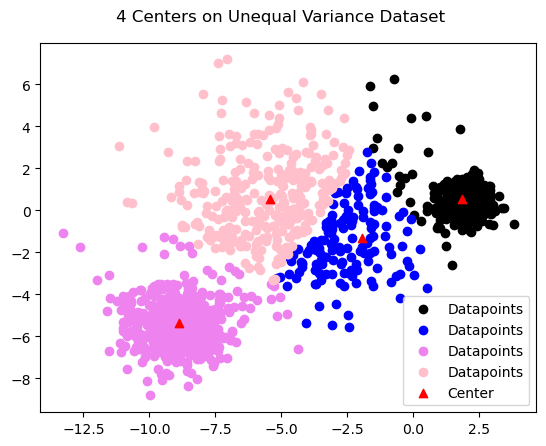

Difference of center to last run: 1.2425548716543062


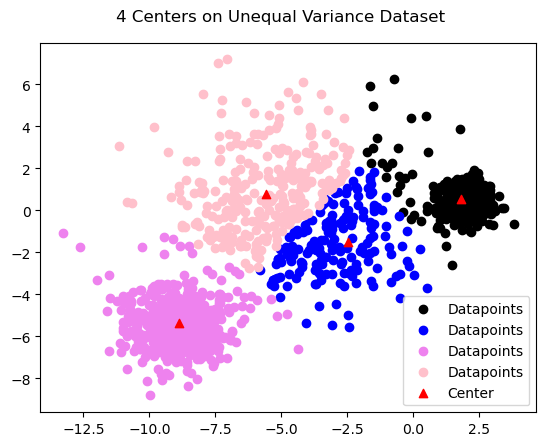

Difference of center to last run: 0.9845257512941661


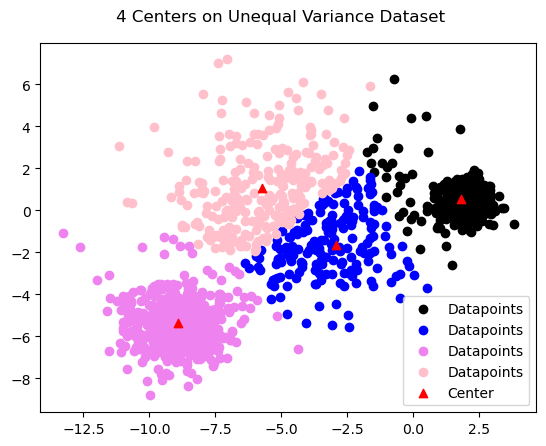

Difference of center to last run: 0.5146393815278446


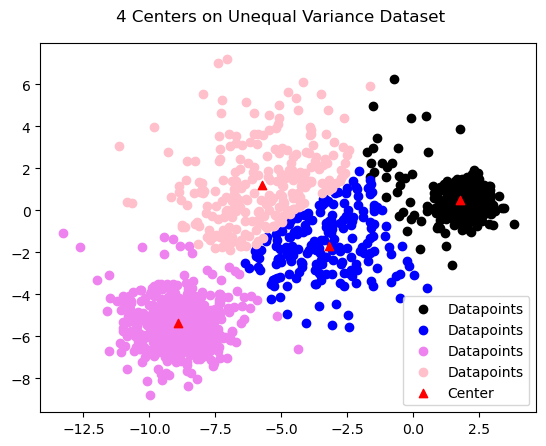

Difference of center to last run: 0.225168116089825
7 IterationSteps untl convertion


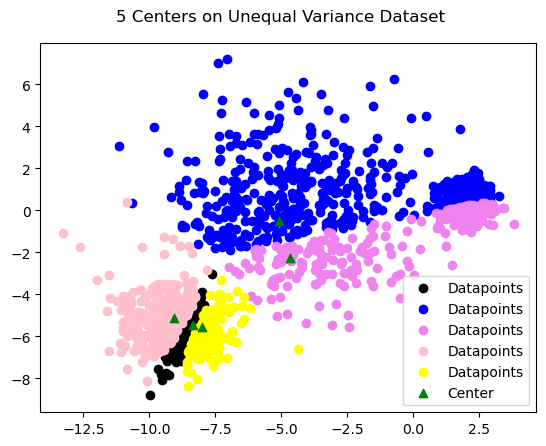

Difference of center to last run: 12.168858121615482


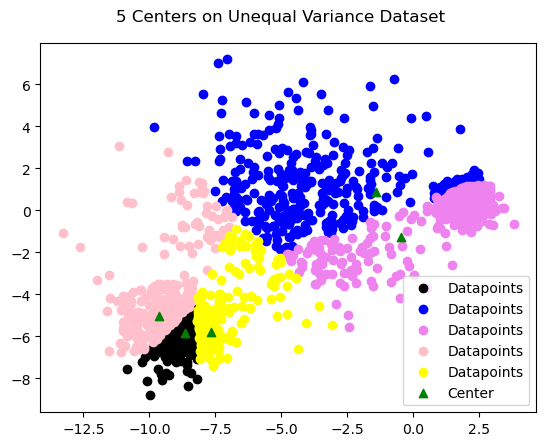

Difference of center to last run: 8.771532404902455


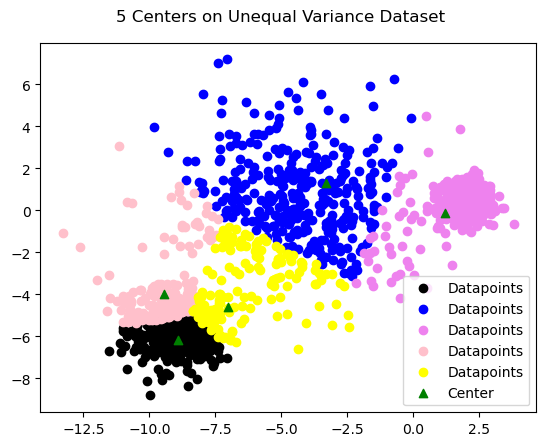

Difference of center to last run: 4.524126057197023


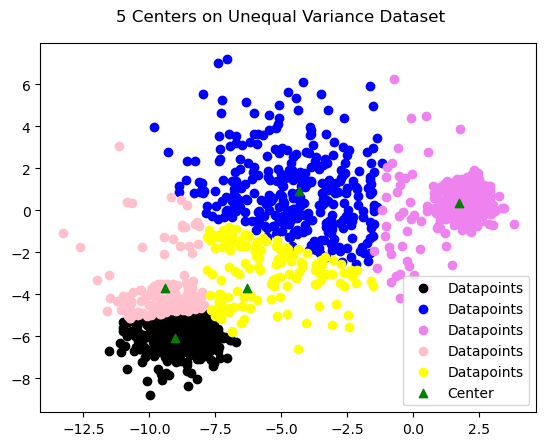

Difference of center to last run: 1.9578632618206266


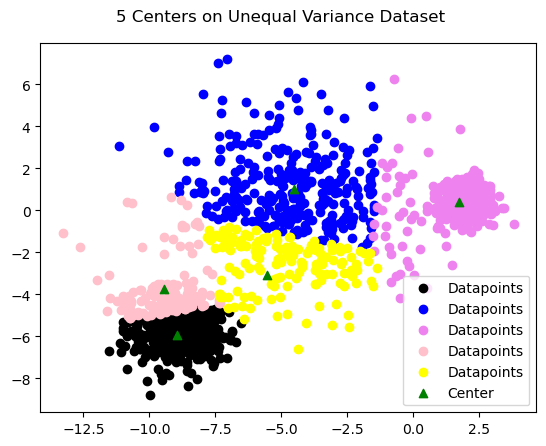

Difference of center to last run: 1.7784566557662789


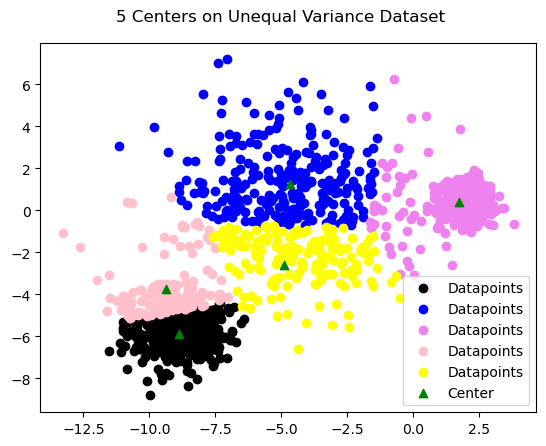

Difference of center to last run: 1.3321680947276104


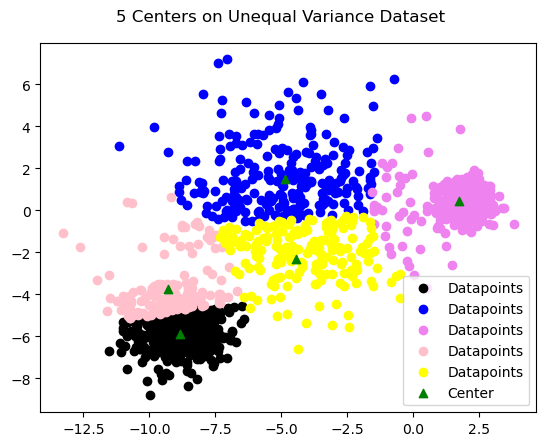

Difference of center to last run: 0.9823047300988033


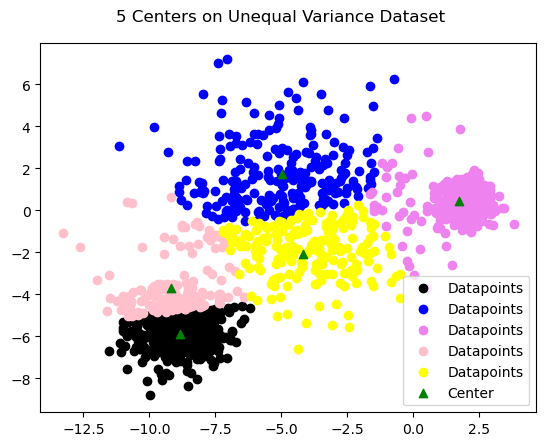

Difference of center to last run: 0.7348113215803423


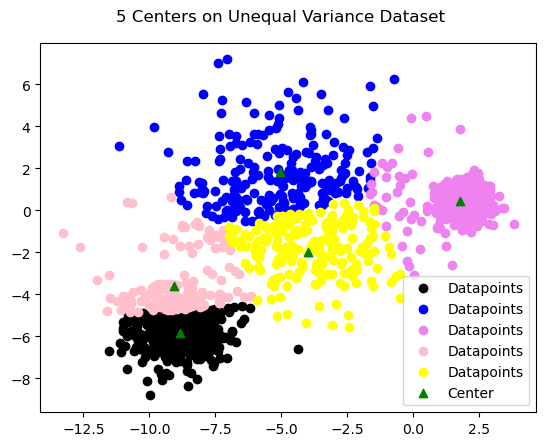

Difference of center to last run: 0.612463408068838


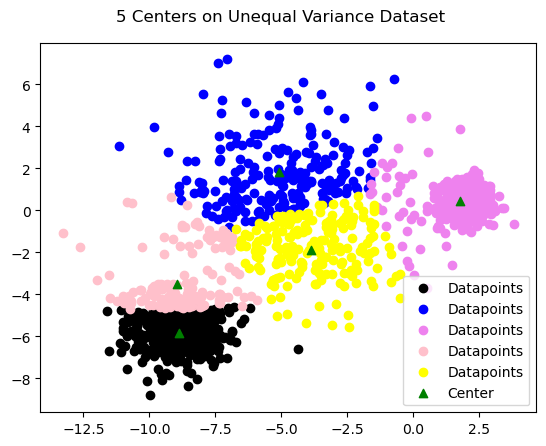

Difference of center to last run: 0.5304564642833207


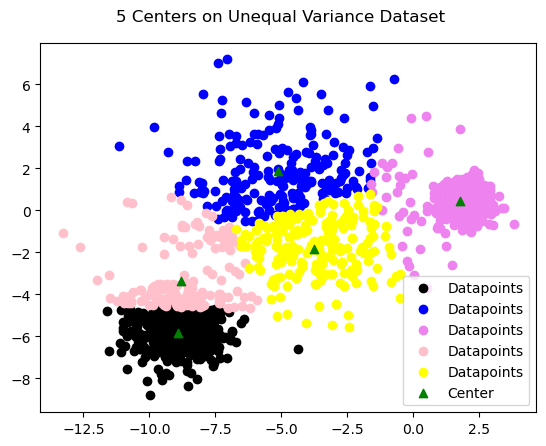

Difference of center to last run: 0.5207394419895253


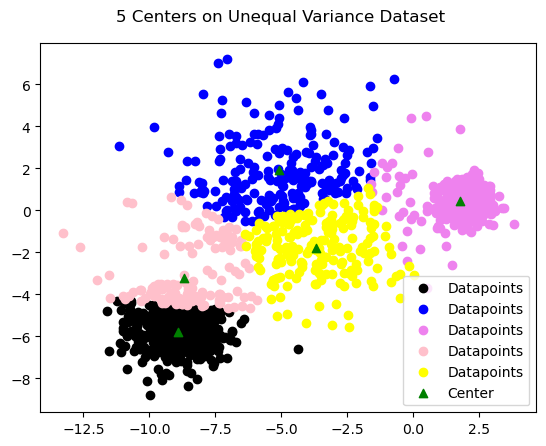

Difference of center to last run: 0.6344358574031216


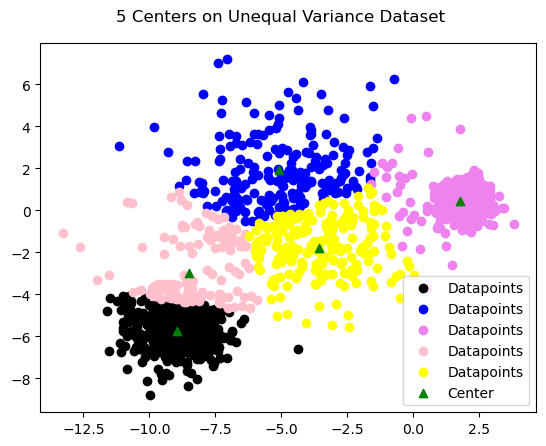

Difference of center to last run: 0.7091093209309478


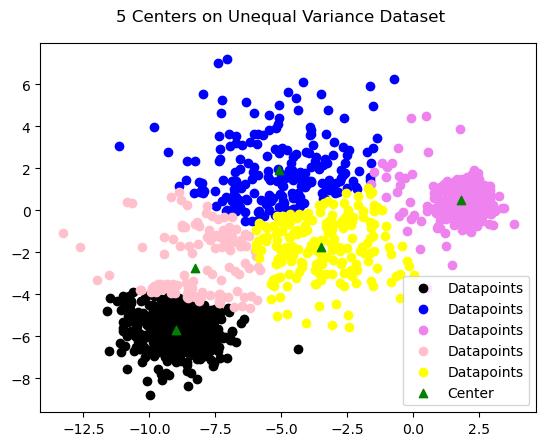

Difference of center to last run: 0.7080613972368468


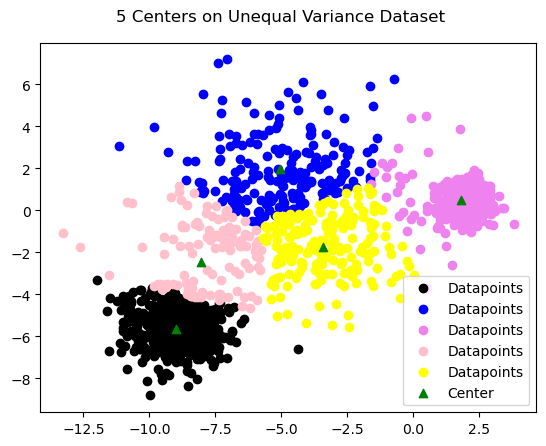

Difference of center to last run: 0.8915907713150555


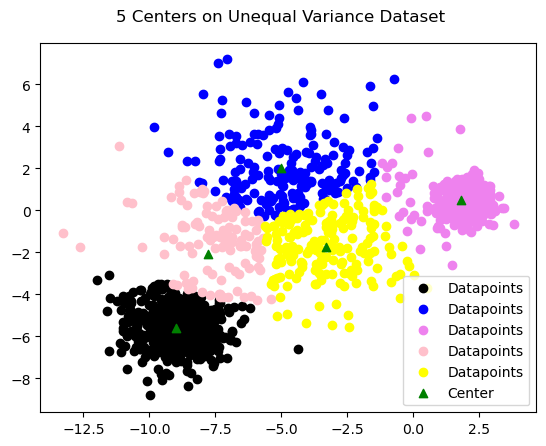

Difference of center to last run: 1.316506192268538


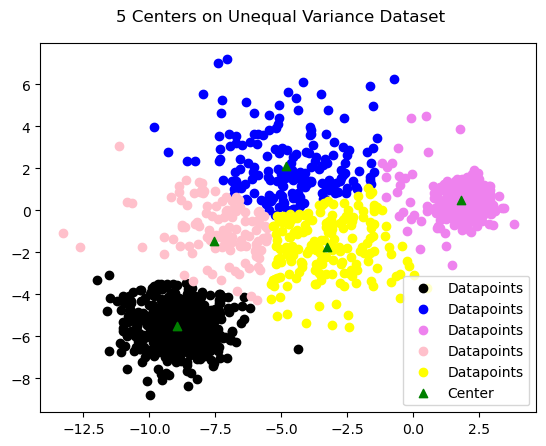

Difference of center to last run: 1.0844840671166052


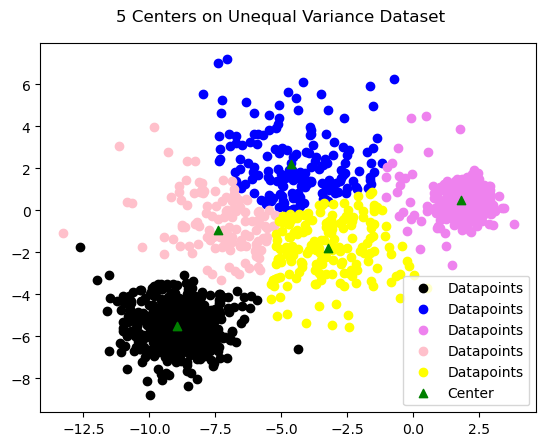

Difference of center to last run: 0.855783152008397


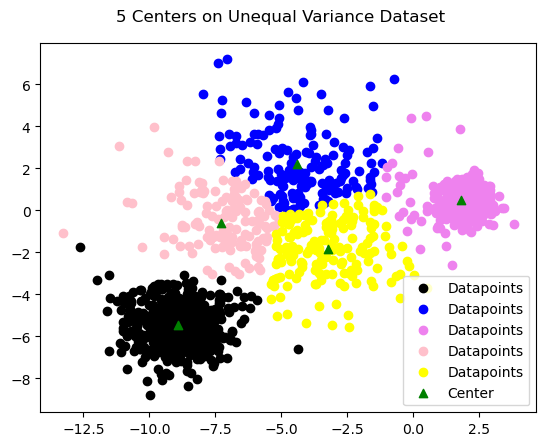

Difference of center to last run: 0.44946388411089094
18 IterationSteps untl convertion


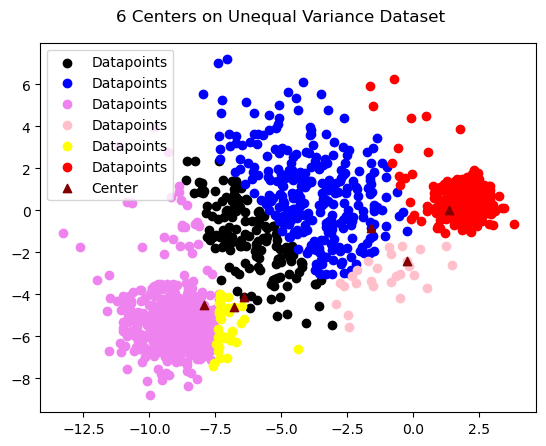

Difference of center to last run: 12.398941140216495


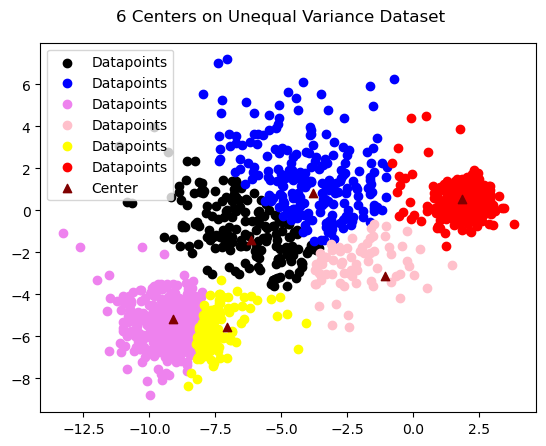

Difference of center to last run: 4.134093165637358


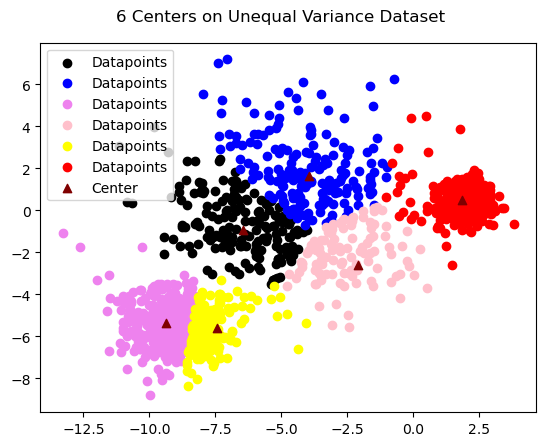

Difference of center to last run: 2.1387403169024752


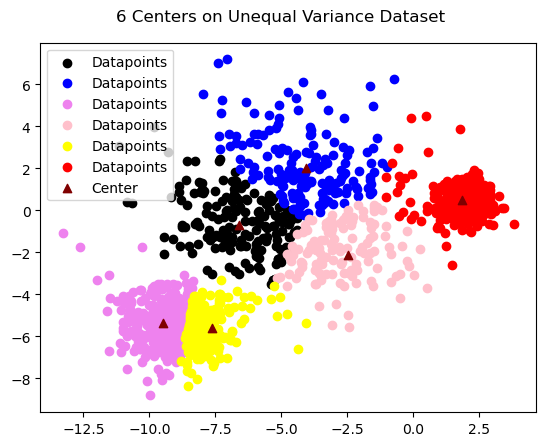

Difference of center to last run: 1.1555329055467776


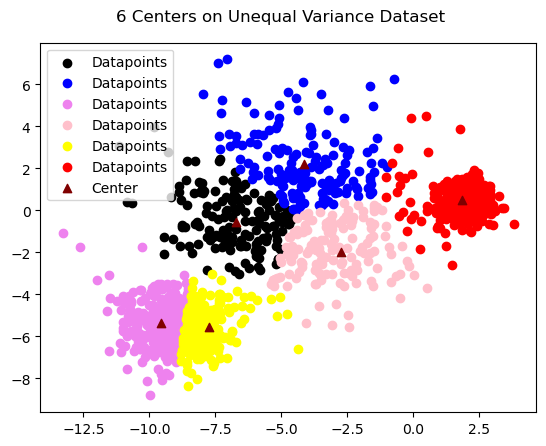

Difference of center to last run: 0.8958156546217567


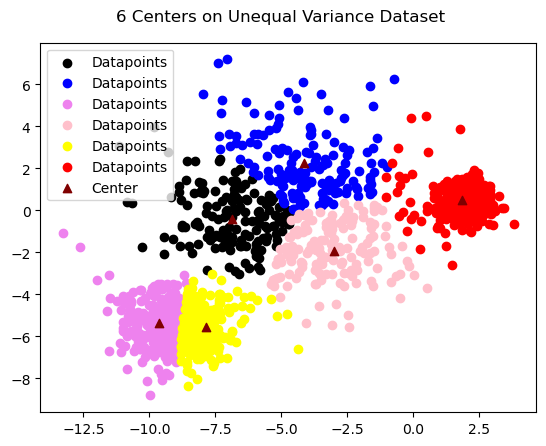

Difference of center to last run: 0.48572207632998354
5 IterationSteps untl convertion


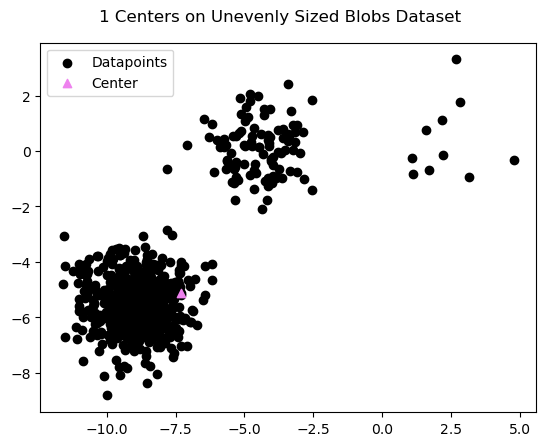

Difference of center to last run: 1.3521956504172232


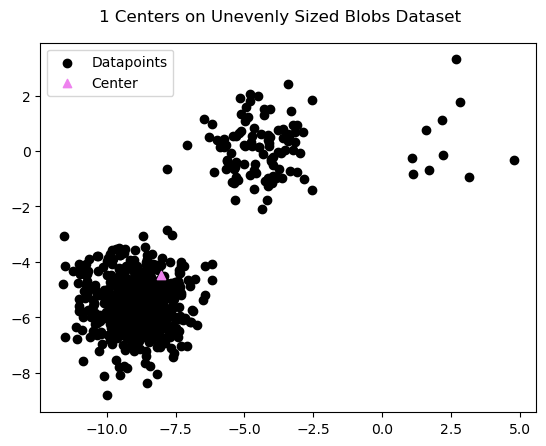

Difference of center to last run: 0.0
1 IterationSteps untl convertion


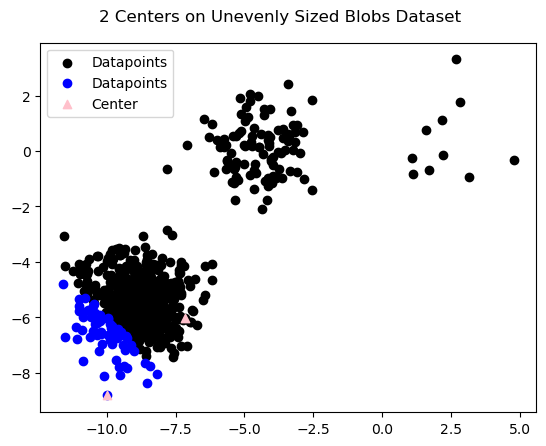

Difference of center to last run: 4.673473634900003


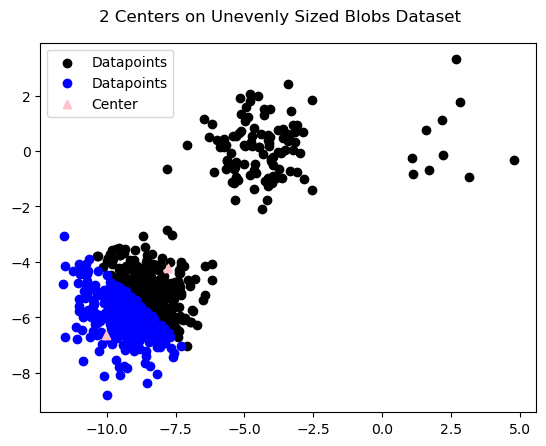

Difference of center to last run: 2.8961965623935906


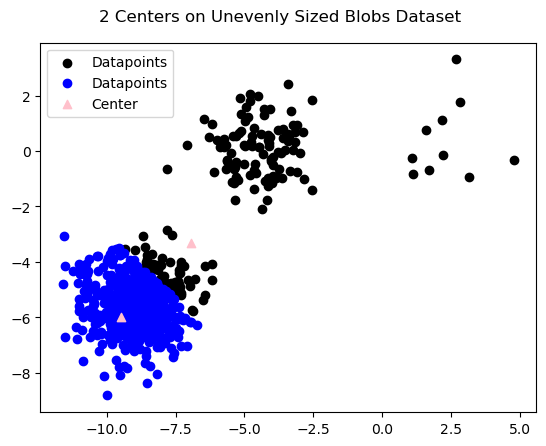

Difference of center to last run: 4.2235629599158795


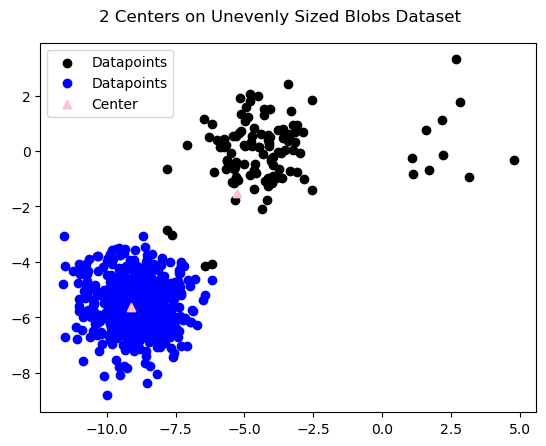

Difference of center to last run: 3.0160506630626207


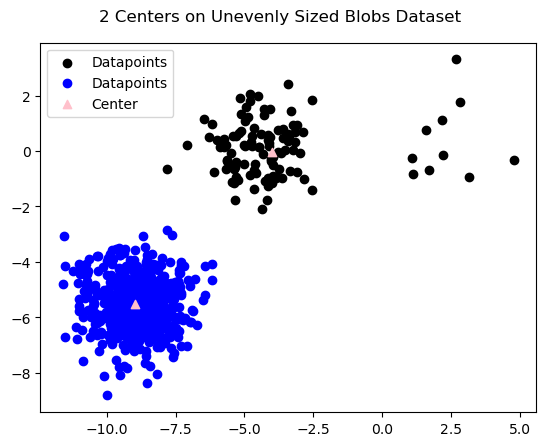

Difference of center to last run: 0.2671099285337914
4 IterationSteps untl convertion


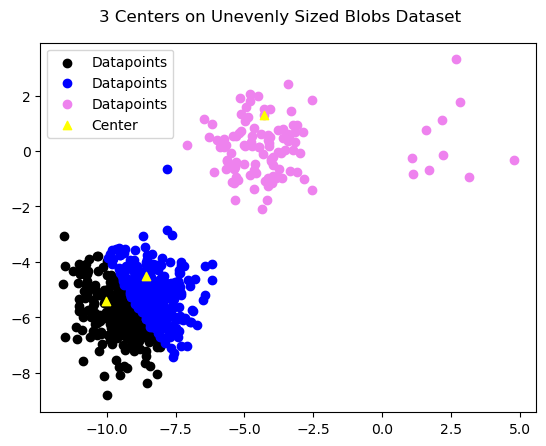

Difference of center to last run: 3.364693438732516


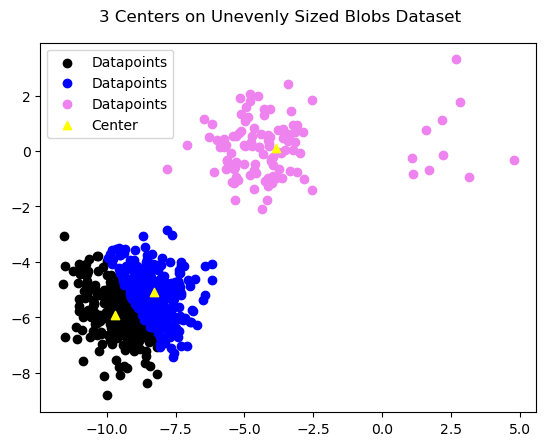

Difference of center to last run: 0.12058470457778642
1 IterationSteps untl convertion


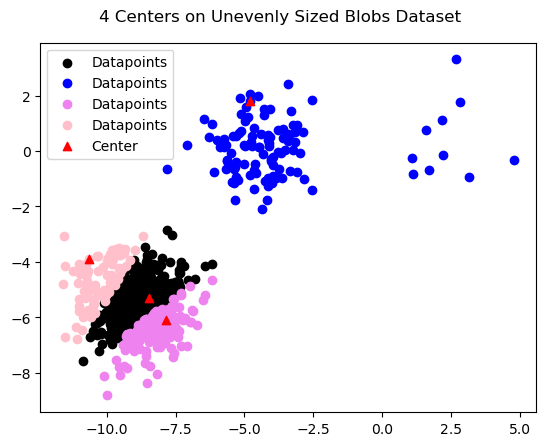

Difference of center to last run: 4.859421105698323


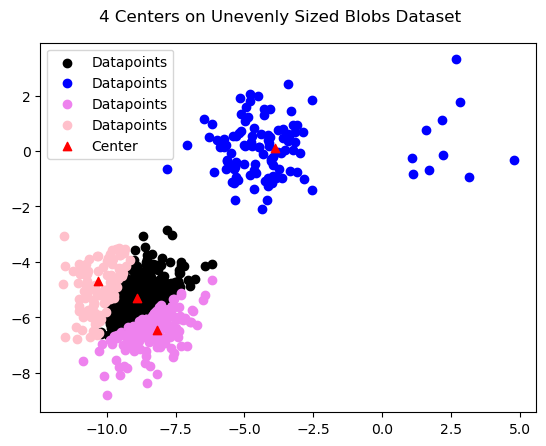

Difference of center to last run: 0.8145111643739744


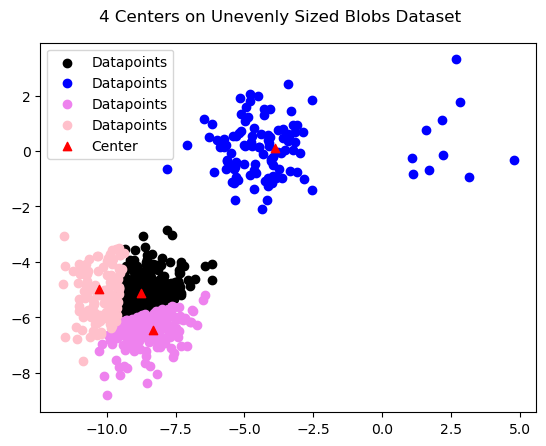

Difference of center to last run: 0.8881659656307388


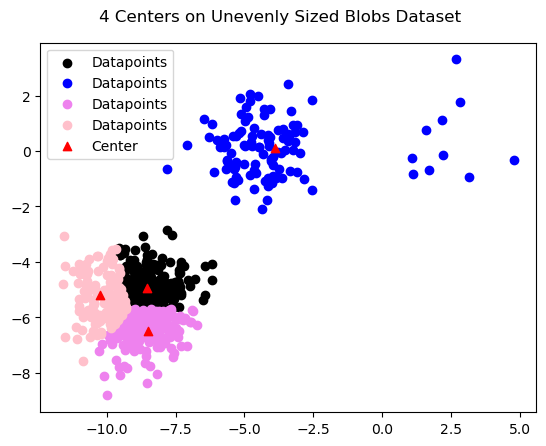

Difference of center to last run: 0.5674037703483901


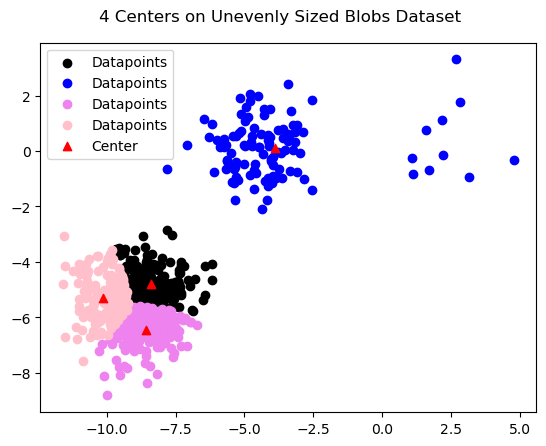

Difference of center to last run: 0.19162918914312144
4 IterationSteps untl convertion


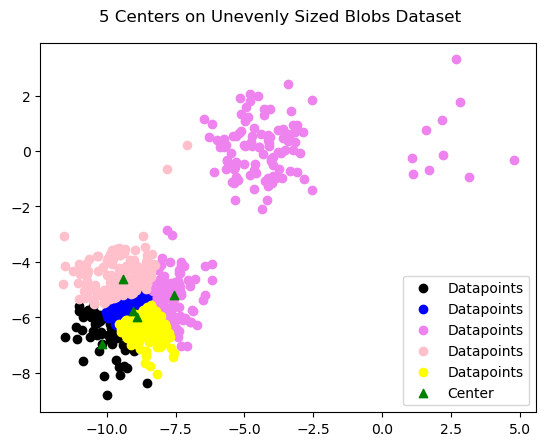

Difference of center to last run: 6.169159373020303


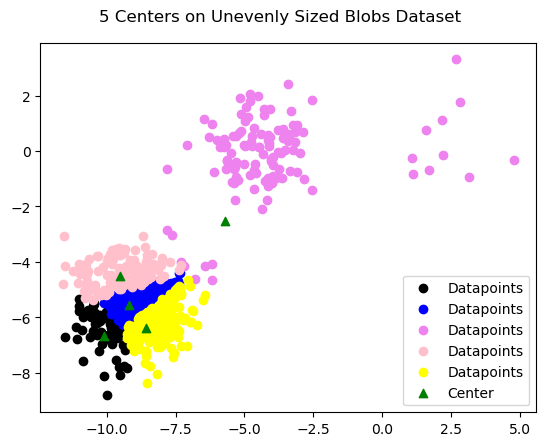

Difference of center to last run: 5.480597898236042


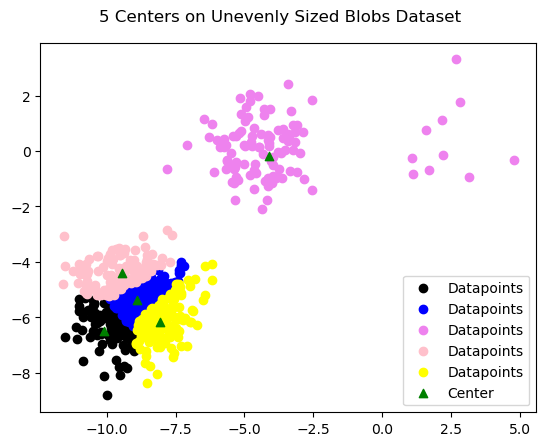

Difference of center to last run: 1.3944210219758273


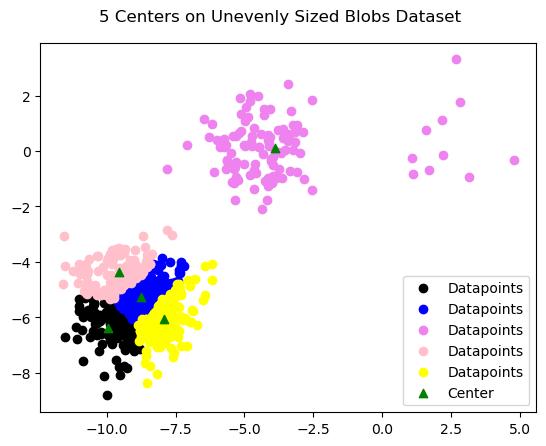

Difference of center to last run: 0.6056860327164868


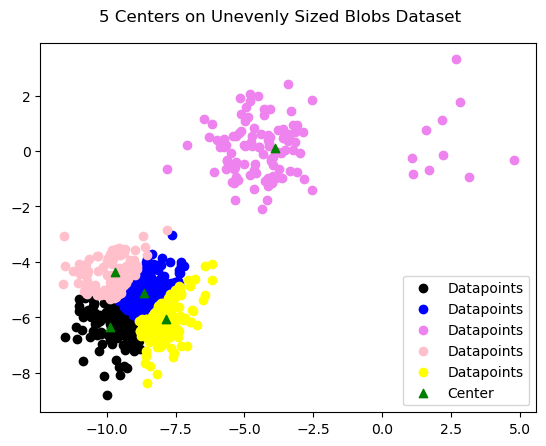

Difference of center to last run: 0.5202552575930541


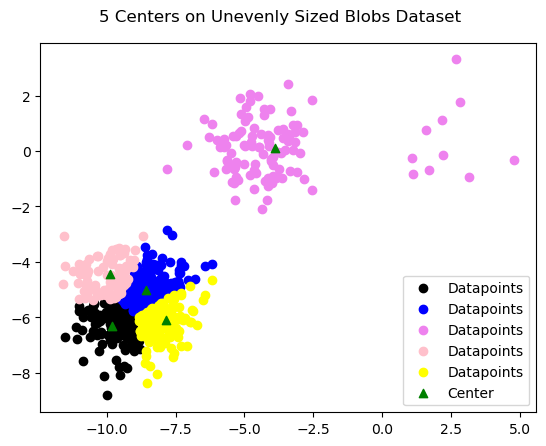

Difference of center to last run: 0.7695854821854695


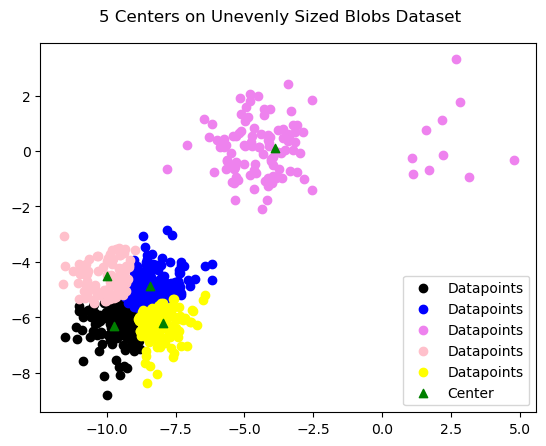

Difference of center to last run: 0.46461237501174324
6 IterationSteps untl convertion


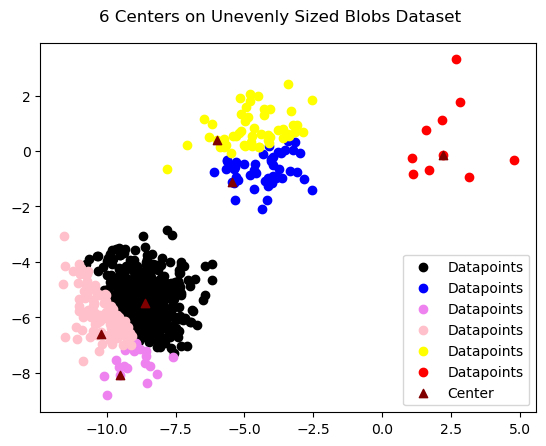

Difference of center to last run: 5.795395263430371


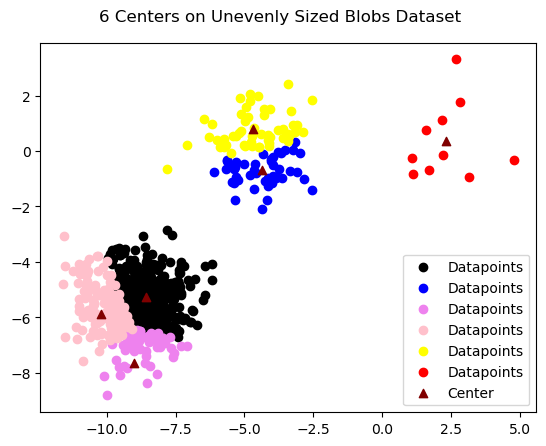

Difference of center to last run: 1.5257055388152243


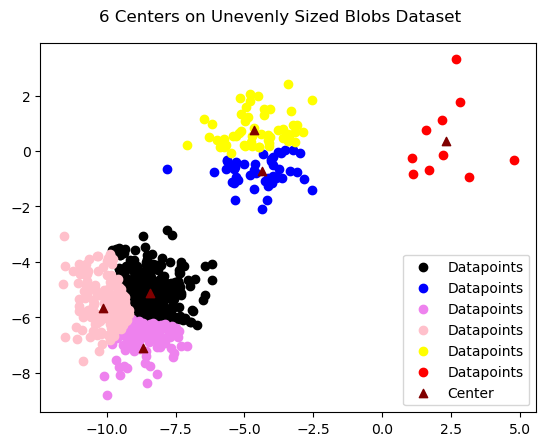

Difference of center to last run: 0.9982599038182286


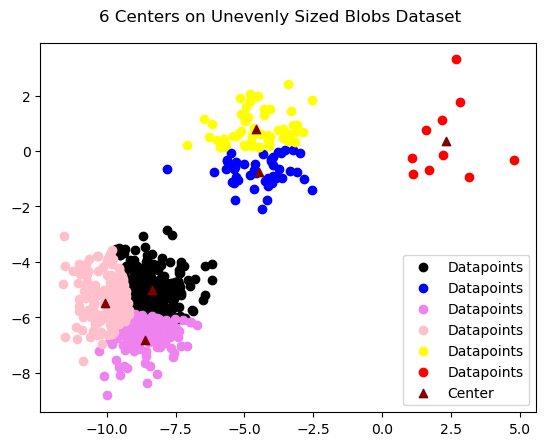

Difference of center to last run: 0.5183887306037755


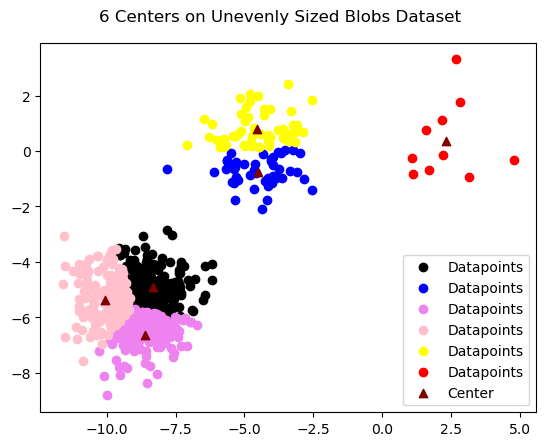

Difference of center to last run: 0.27672971759612786
4 IterationSteps untl convertion


In [6]:
#generate different colors
colors = np.array(["black","blue","violet","pink","yellow","red","green","maroon","orange","brown"])

#run lloyds algorithem 
LloydForAllCenters(X,6, "Mixture of Gaussian Blobs")
LloydForAllCenters(X_aniso,6, "Anisotropically Distributed Blobs")
LloydForAllCenters(X_varied,6, "Unequal Variance")
LloydForAllCenters(X_filtered,6, "Unevenly Sized Blobs")

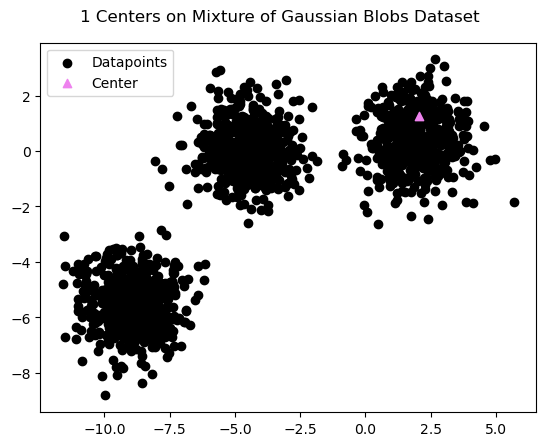

Difference of center to last run: 8.857833015960072


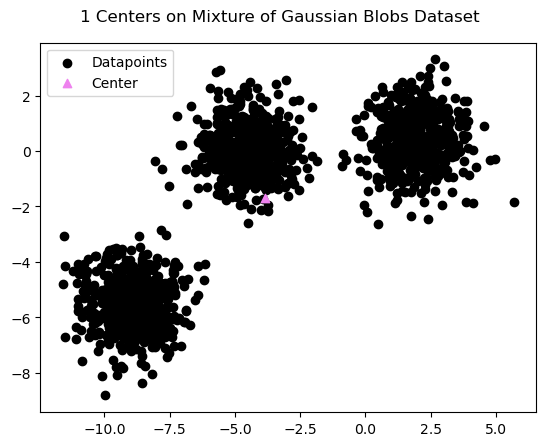

Difference of center to last run: 0.0
1 IterationSteps untl convertion


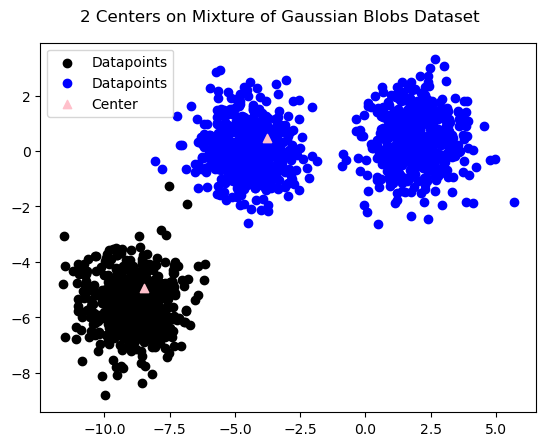

Difference of center to last run: 3.7236455116800014


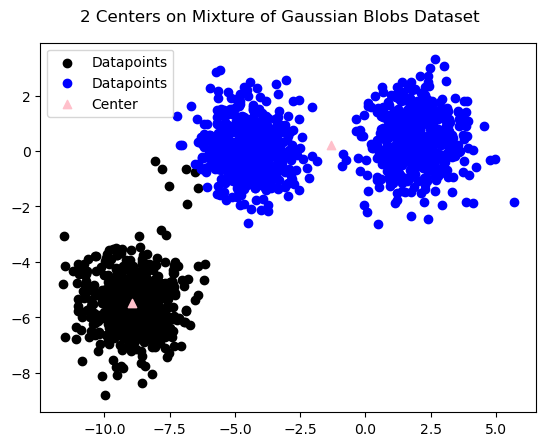

Difference of center to last run: 0.09848395583399089
1 IterationSteps untl convertion


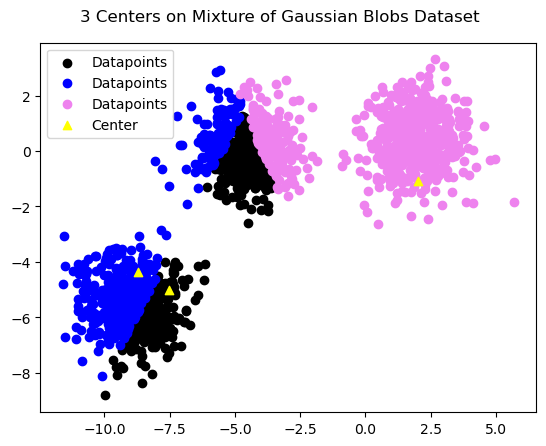

Difference of center to last run: 7.189780784133803


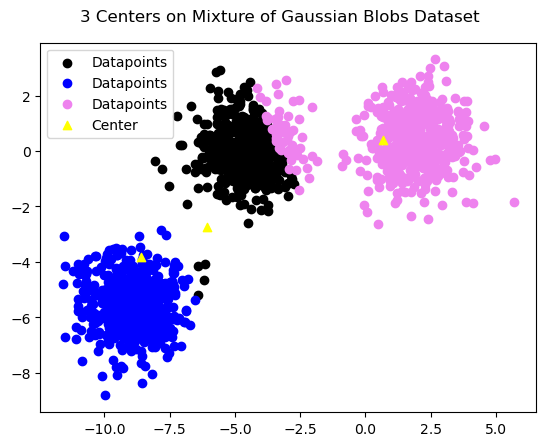

Difference of center to last run: 6.809121232086187


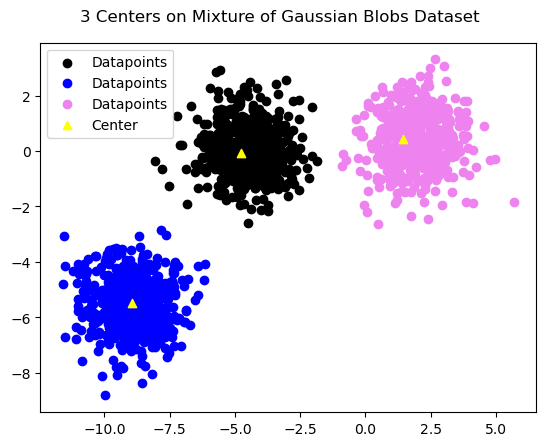

Difference of center to last run: 0.8616148654897391


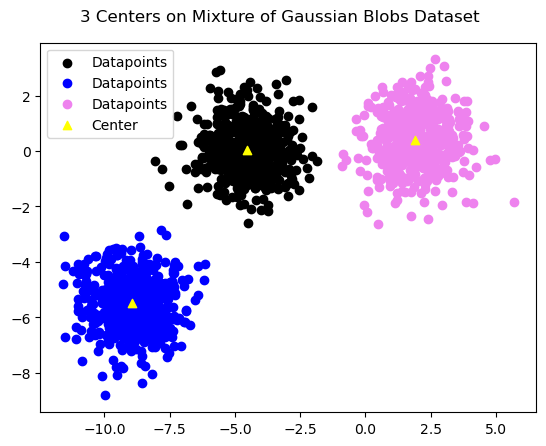

Difference of center to last run: 0.0
3 IterationSteps untl convertion


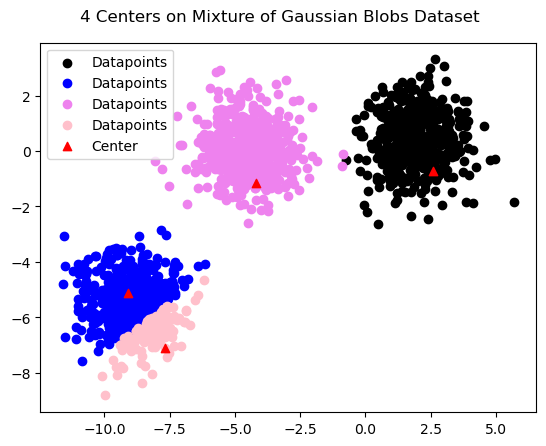

Difference of center to last run: 4.4239954751860715


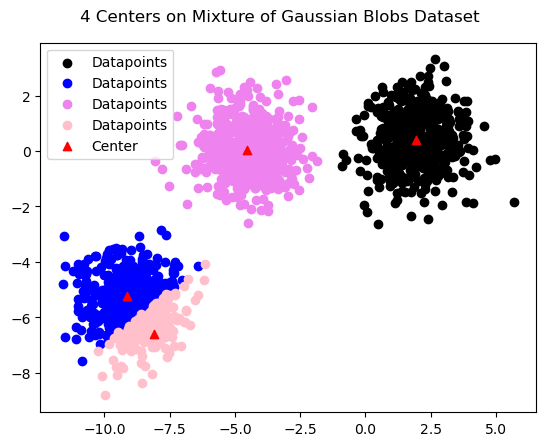

Difference of center to last run: 0.5700345822730712


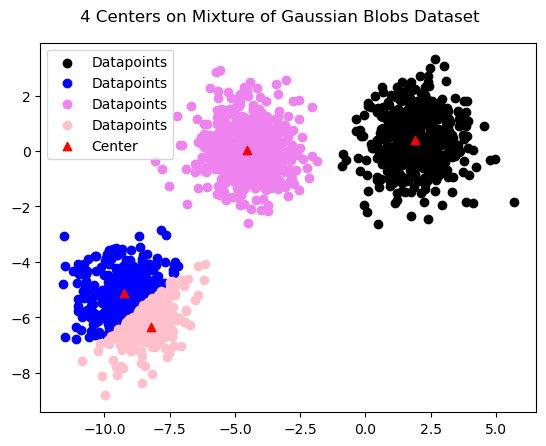

Difference of center to last run: 0.4133832474850312
2 IterationSteps untl convertion


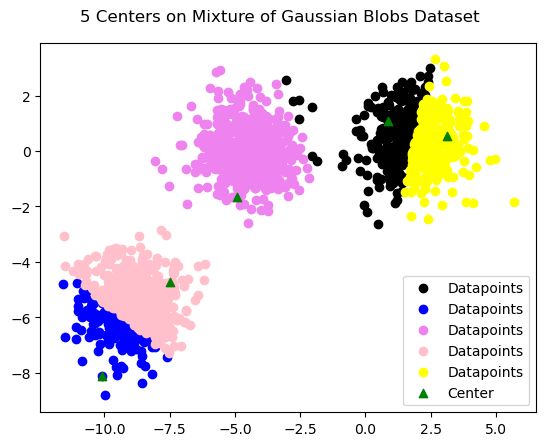

Difference of center to last run: 7.12103022480848


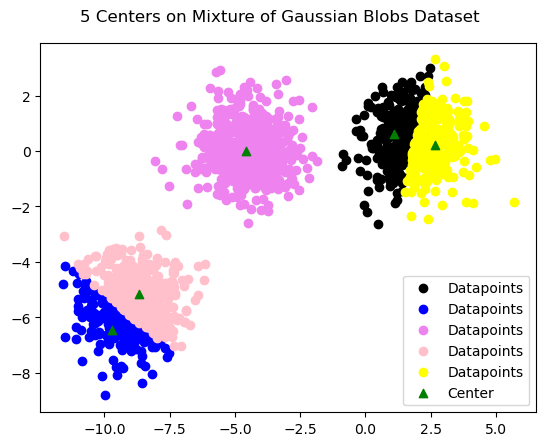

Difference of center to last run: 0.5843620547258997


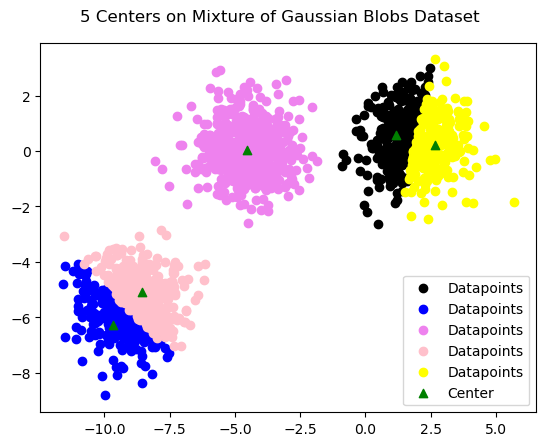

Difference of center to last run: 0.344723120343833
2 IterationSteps untl convertion


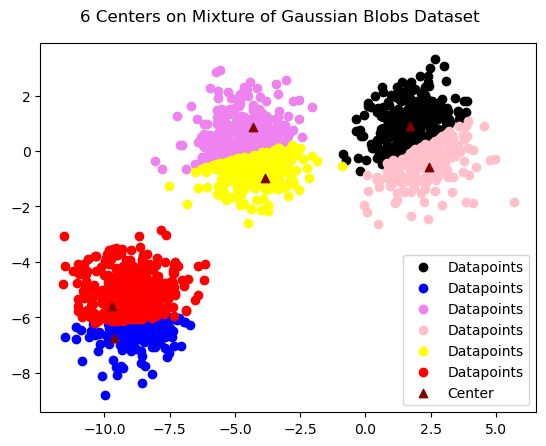

Difference of center to last run: 3.752590388511949


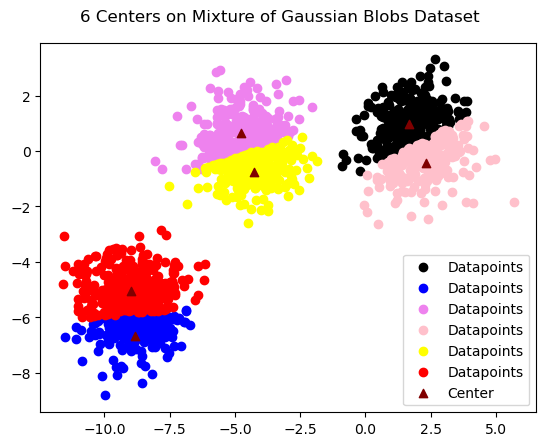

Difference of center to last run: 0.6594487809890077


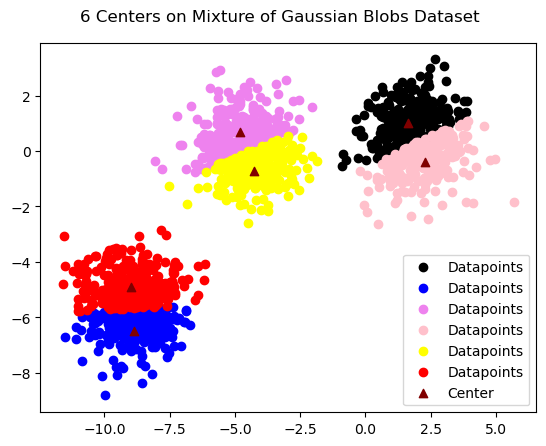

Difference of center to last run: 0.4805363049149214
2 IterationSteps untl convertion


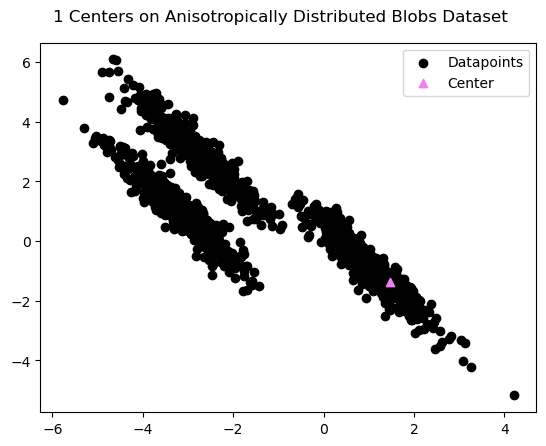

Difference of center to last run: 5.530754467286253


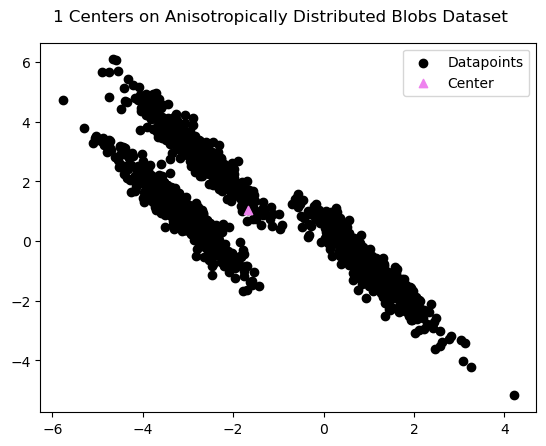

Difference of center to last run: 0.0
1 IterationSteps untl convertion


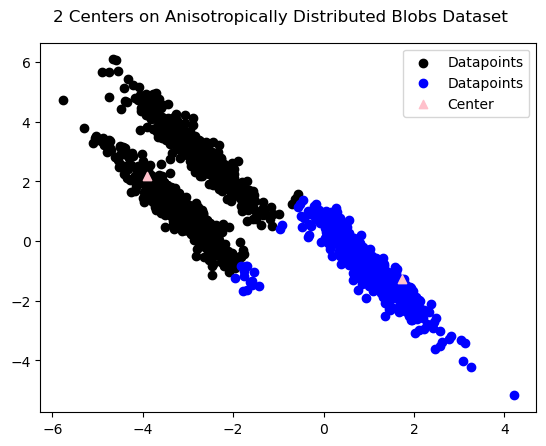

Difference of center to last run: 2.24718155240577


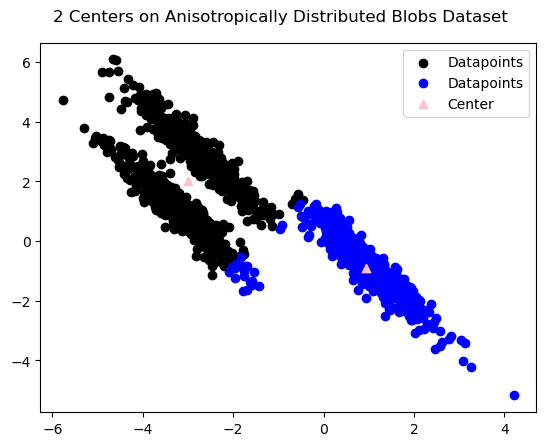

Difference of center to last run: 0.05508909554090735
1 IterationSteps untl convertion


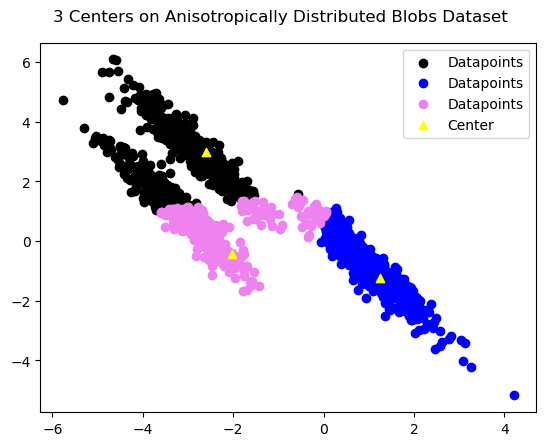

Difference of center to last run: 2.4049955191605035


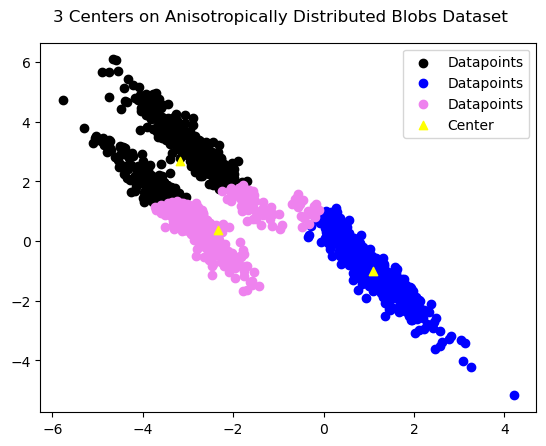

Difference of center to last run: 0.5349671039428558


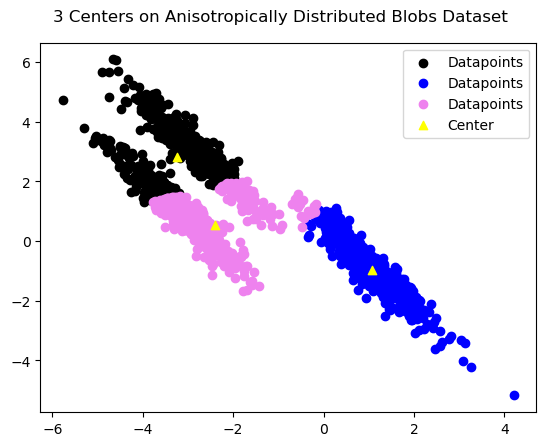

Difference of center to last run: 0.372830004233519
2 IterationSteps untl convertion


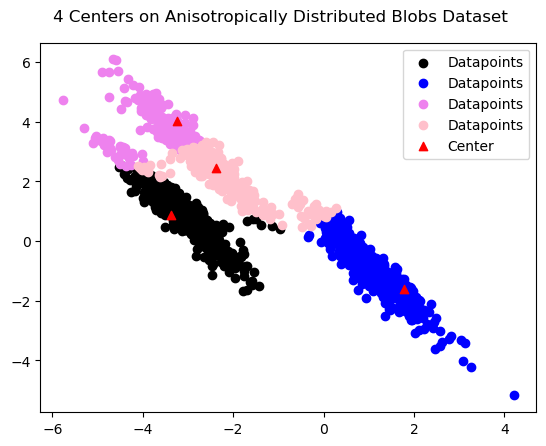

Difference of center to last run: 2.8294314107507916


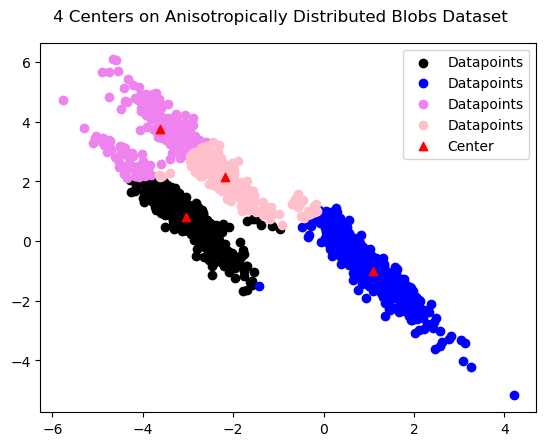

Difference of center to last run: 0.4167587797065244
1 IterationSteps untl convertion


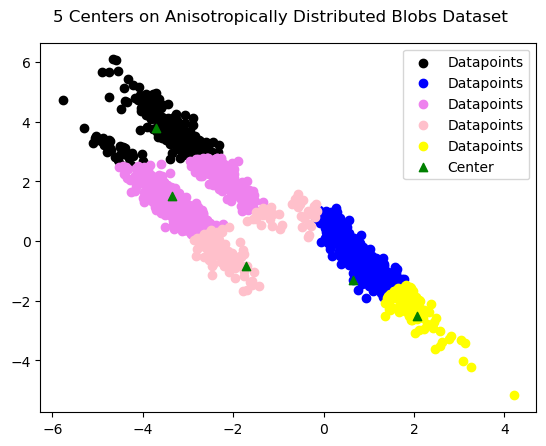

Difference of center to last run: 3.1388535731546763


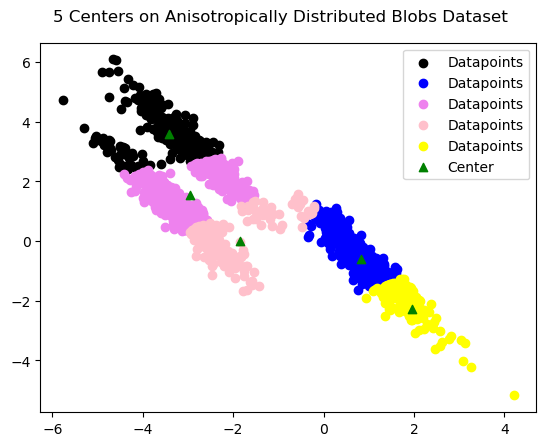

Difference of center to last run: 1.0943825019222948


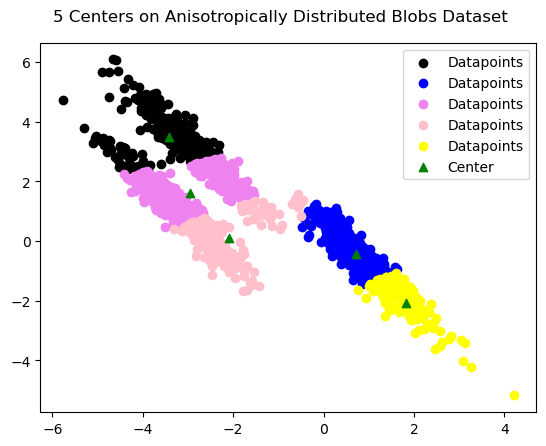

Difference of center to last run: 0.6878755961030592


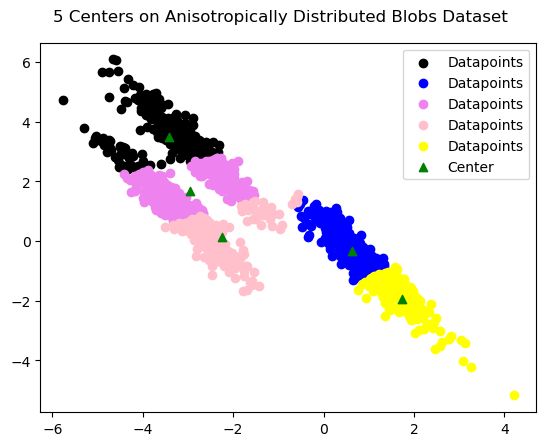

Difference of center to last run: 0.5139601221054659


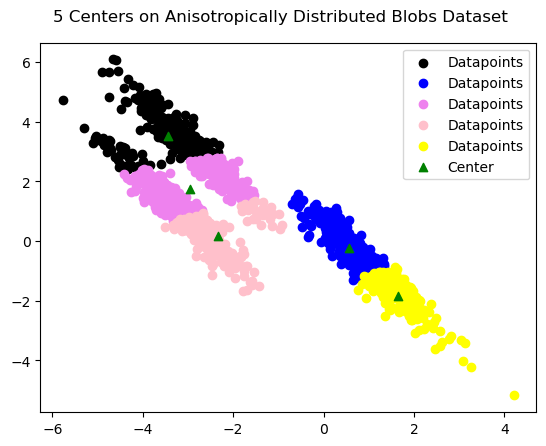

Difference of center to last run: 0.3775147998485451
4 IterationSteps untl convertion


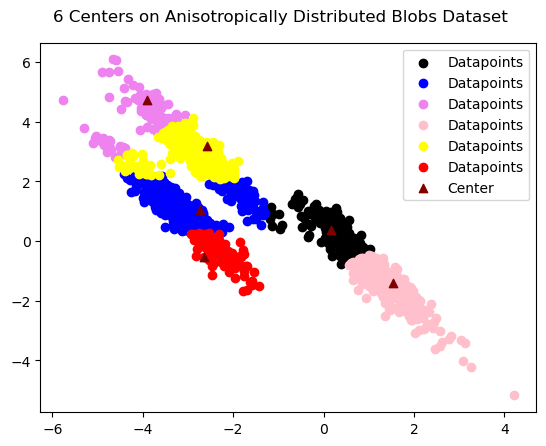

Difference of center to last run: 2.7422027094010186


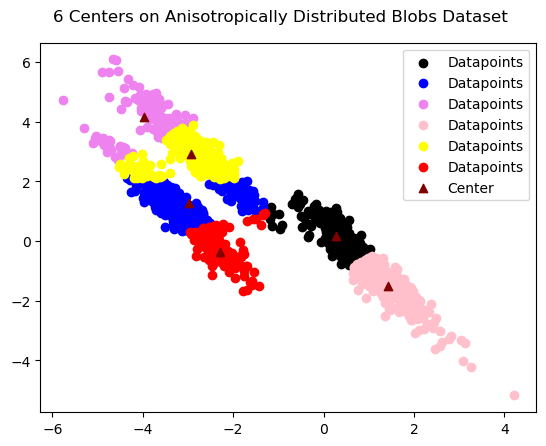

Difference of center to last run: 0.7082066704400428


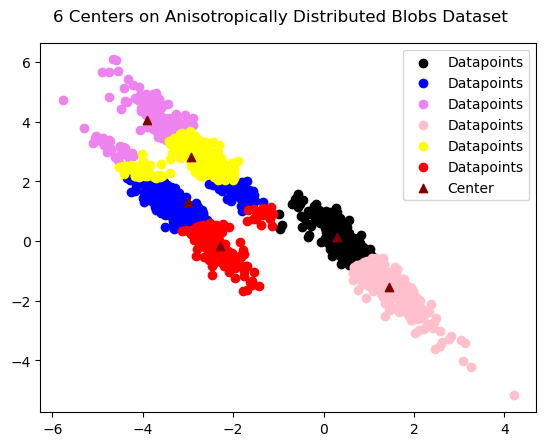

Difference of center to last run: 0.5816687893877297


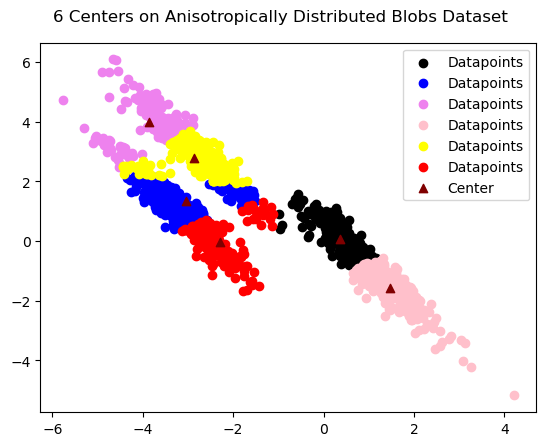

Difference of center to last run: 0.499314770694916
3 IterationSteps untl convertion


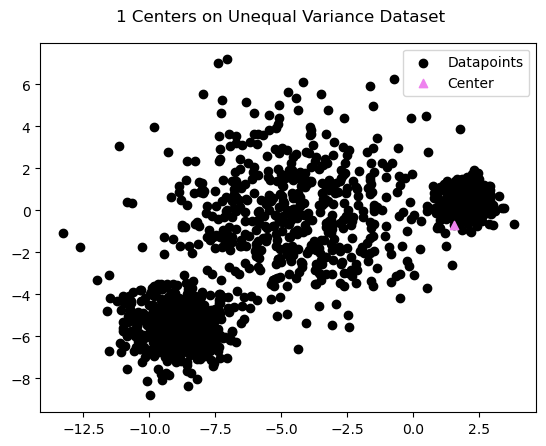

Difference of center to last run: 6.391504637859173


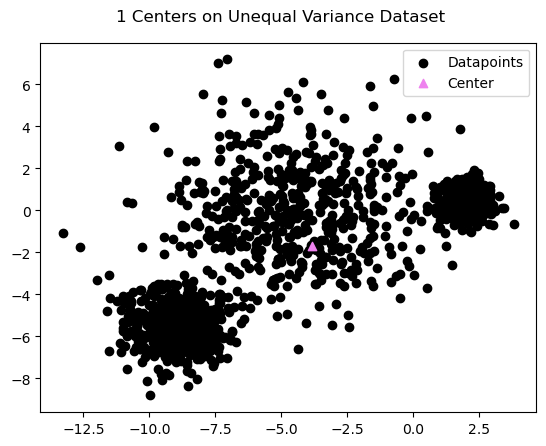

Difference of center to last run: 0.0
1 IterationSteps untl convertion


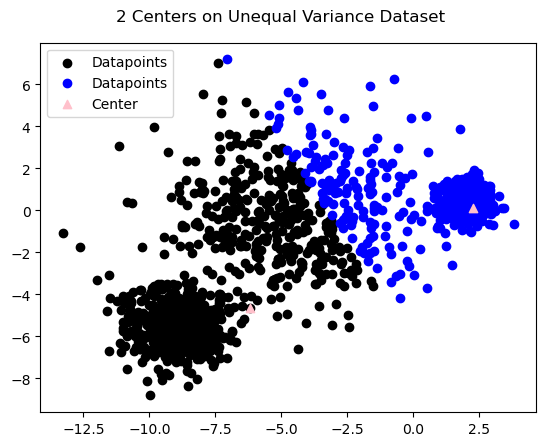

Difference of center to last run: 4.350364104170528


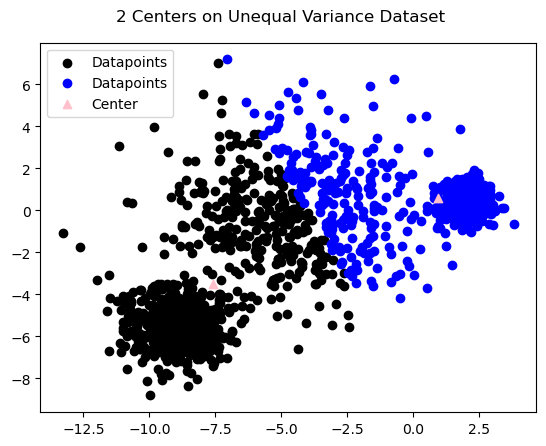

Difference of center to last run: 0.9229368745153848


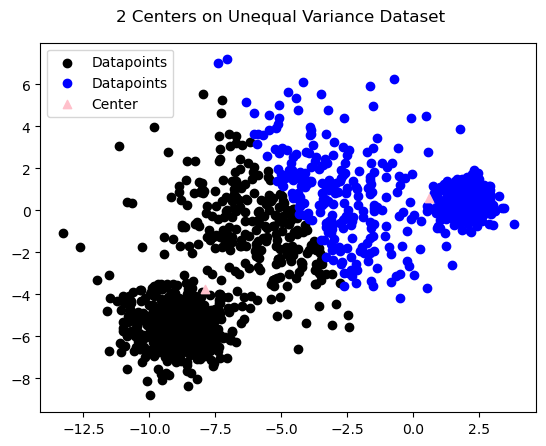

Difference of center to last run: 0.5342362294150145


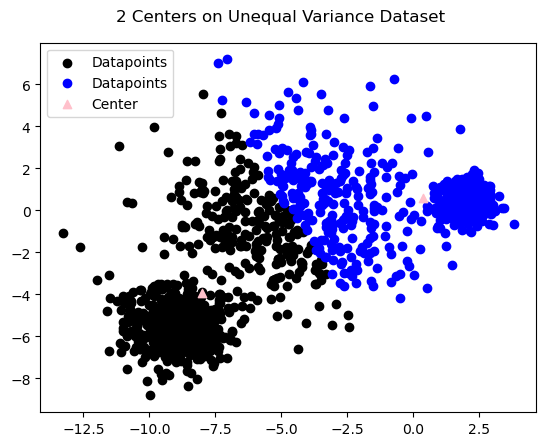

Difference of center to last run: 0.3625918593648587
3 IterationSteps untl convertion


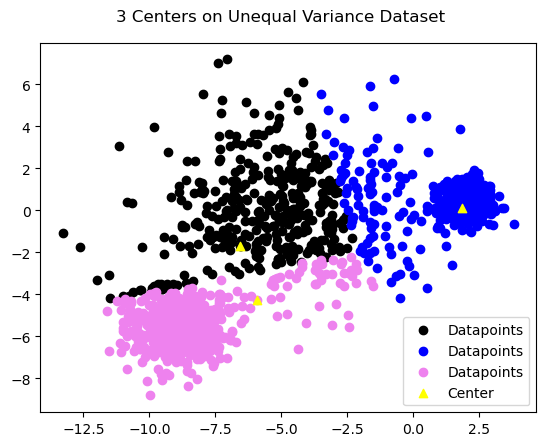

Difference of center to last run: 6.9516047311198275


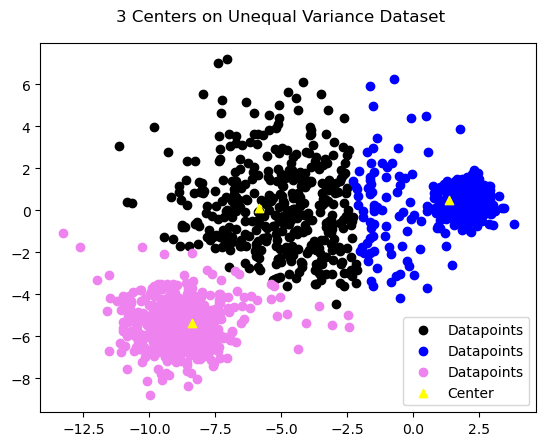

Difference of center to last run: 1.516056001203245


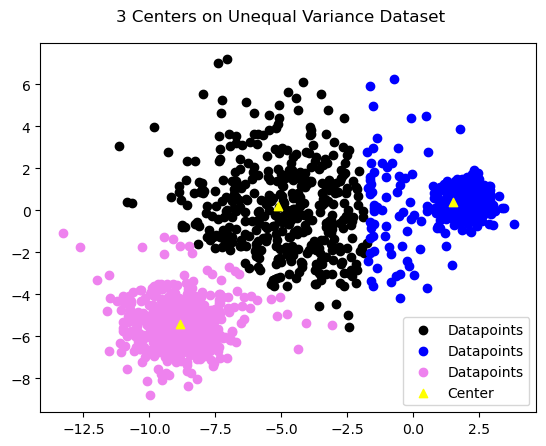

Difference of center to last run: 0.3507584996922277
2 IterationSteps untl convertion


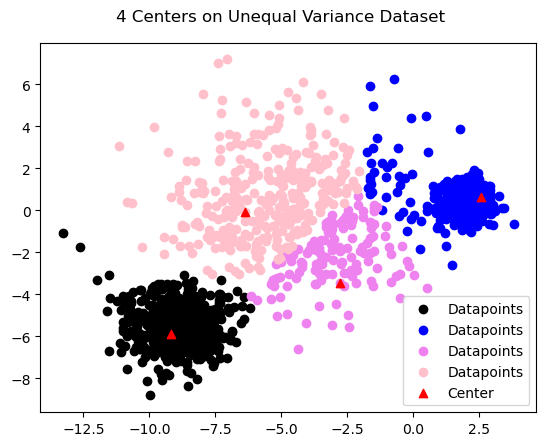

Difference of center to last run: 4.626802788208382


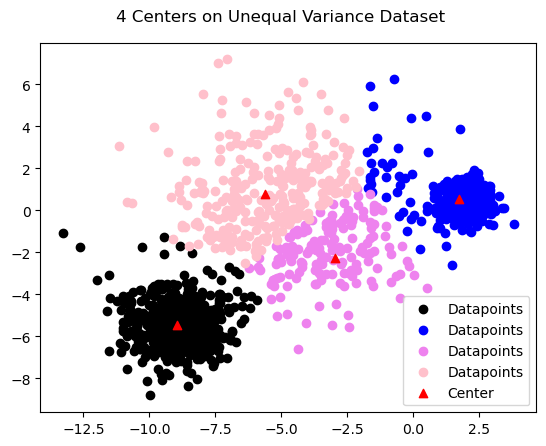

Difference of center to last run: 0.7938248669477509


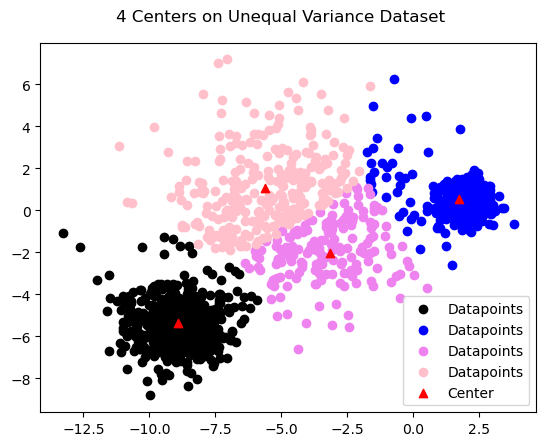

Difference of center to last run: 0.3618391431889566
2 IterationSteps untl convertion


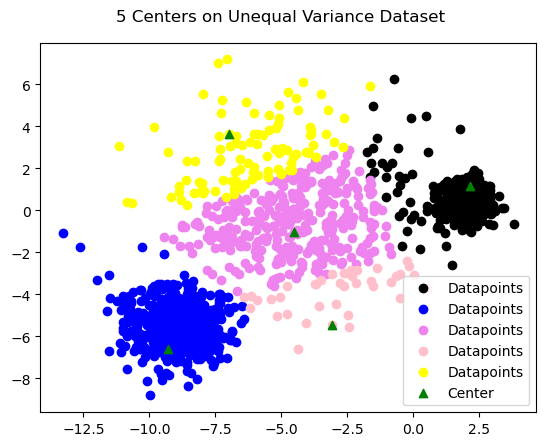

Difference of center to last run: 6.336560419896443


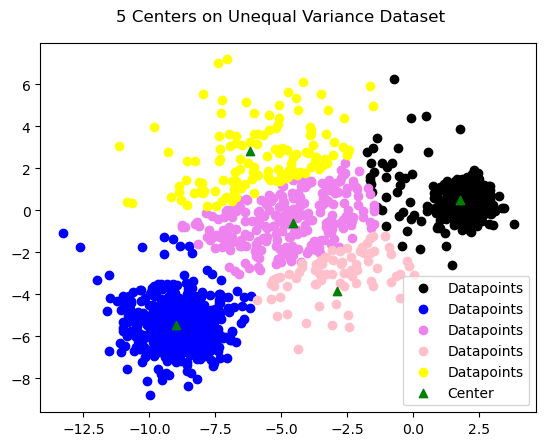

Difference of center to last run: 1.8021825524854562


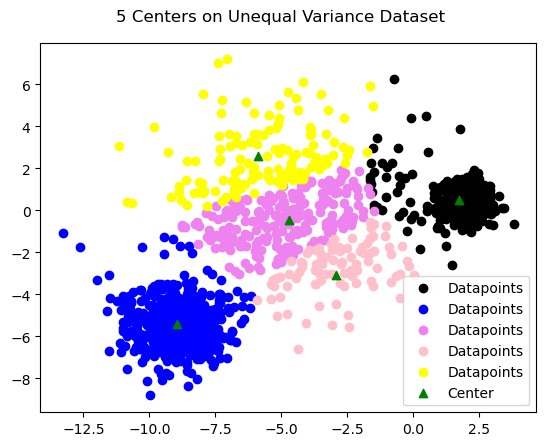

Difference of center to last run: 0.5995975003024676


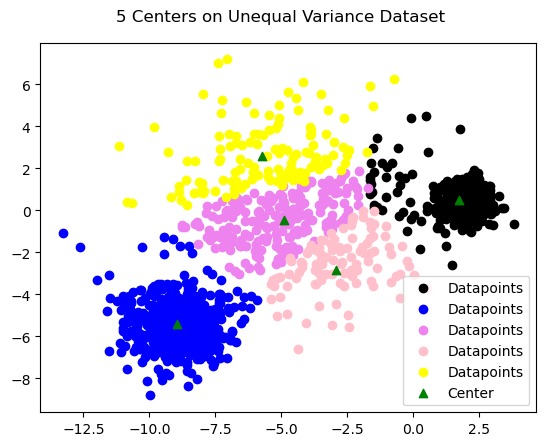

Difference of center to last run: 0.7373125237786986


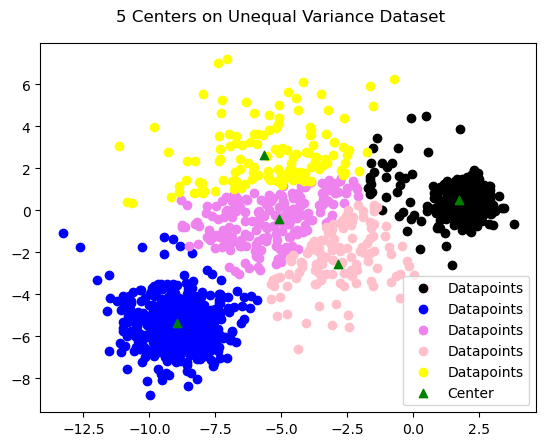

Difference of center to last run: 0.8164265697381845


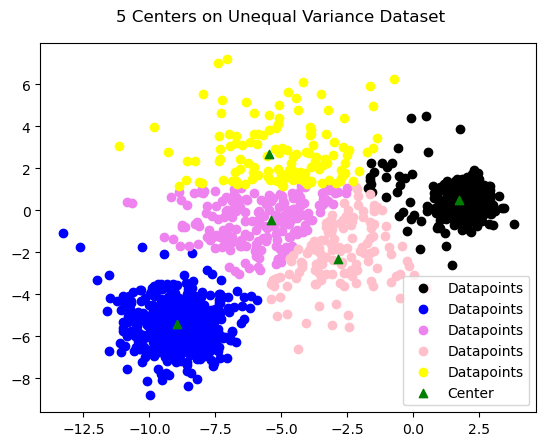

Difference of center to last run: 1.3560021362227939


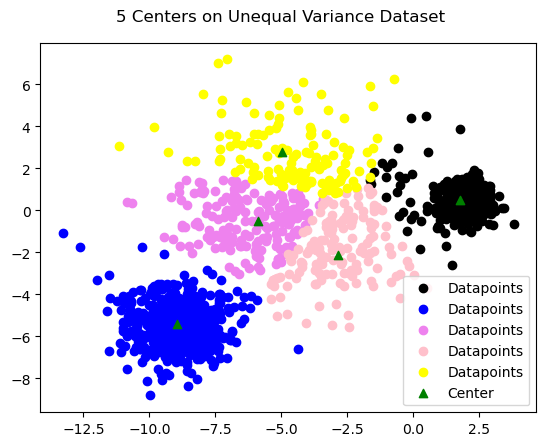

Difference of center to last run: 1.172065111264084


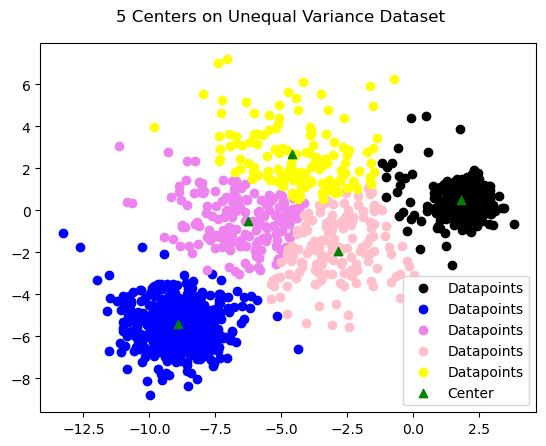

Difference of center to last run: 0.8932210096616843


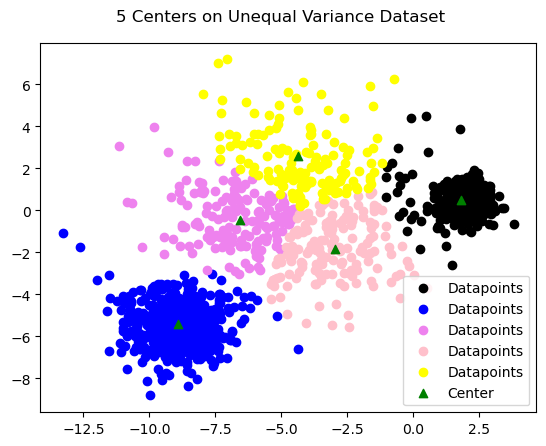

Difference of center to last run: 0.7801286720286247


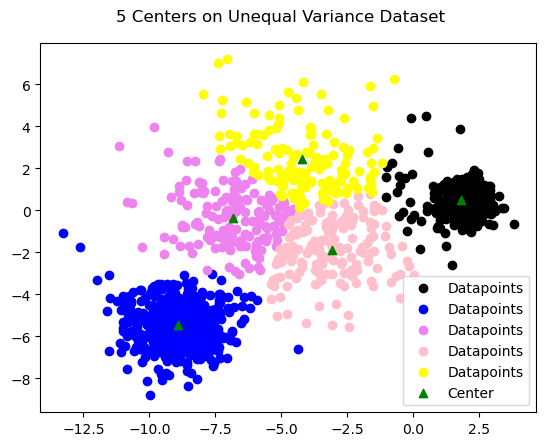

Difference of center to last run: 0.32604091916702177
9 IterationSteps untl convertion


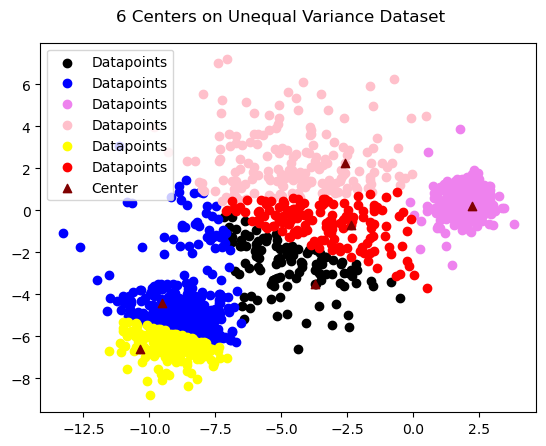

Difference of center to last run: 7.373877475716707


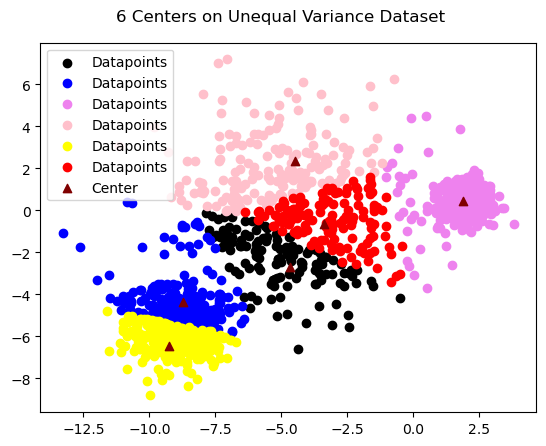

Difference of center to last run: 2.5482122545211623


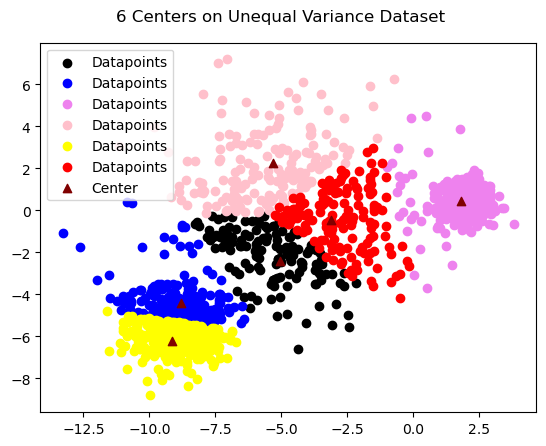

Difference of center to last run: 1.6204756521850645


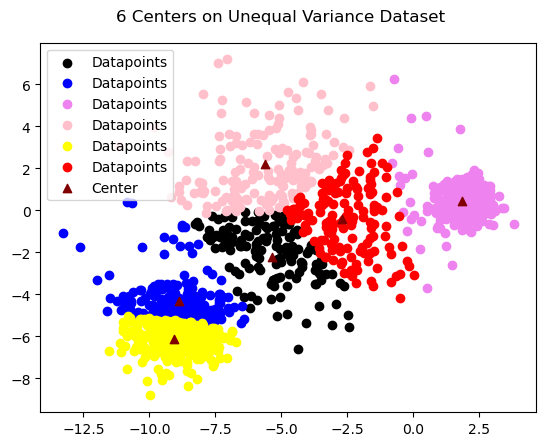

Difference of center to last run: 0.6115452952185062


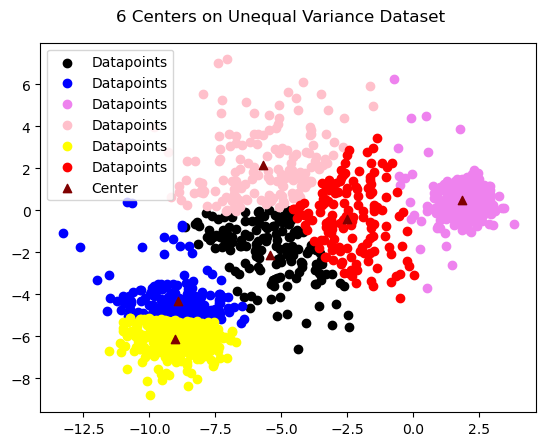

Difference of center to last run: 0.4002809261756328
4 IterationSteps untl convertion


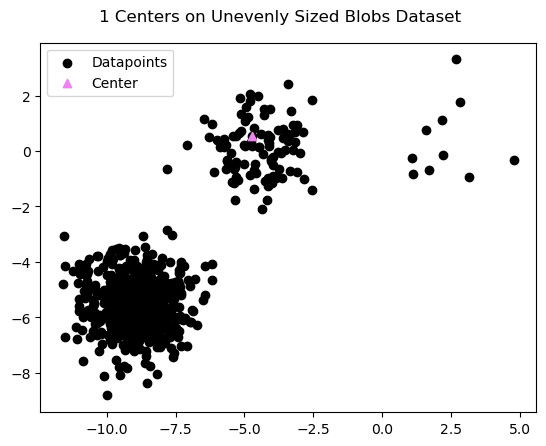

Difference of center to last run: 8.303785273287541


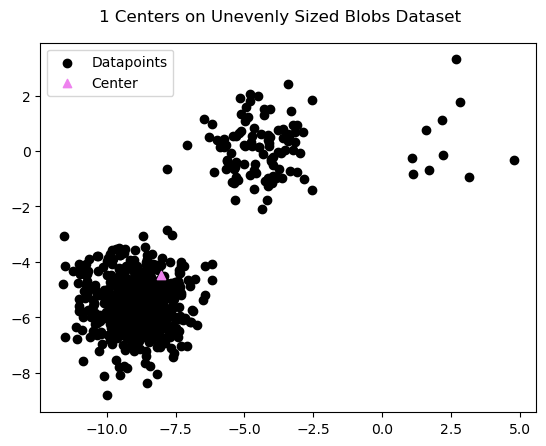

Difference of center to last run: 0.0
1 IterationSteps untl convertion


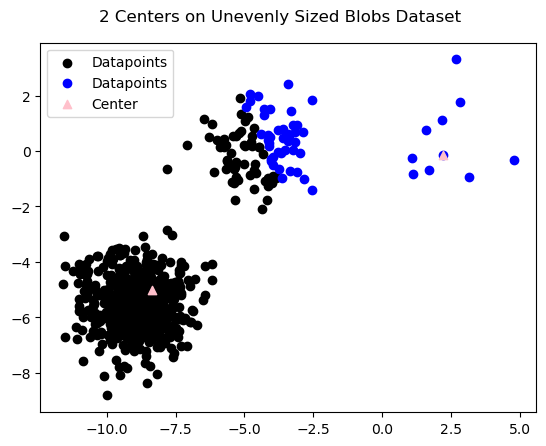

Difference of center to last run: 5.629056416936995


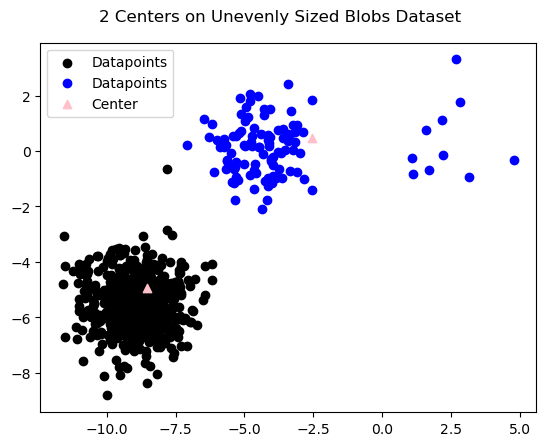

Difference of center to last run: 2.6247293912541476


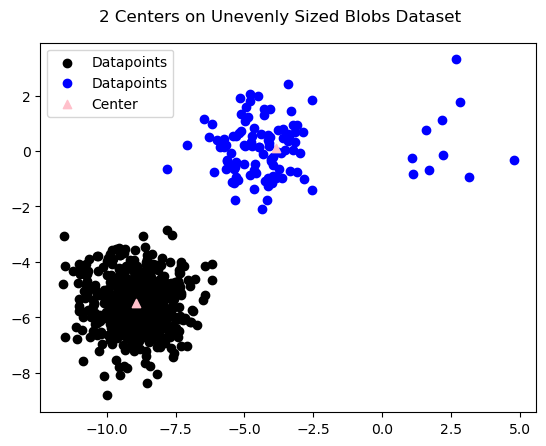

Difference of center to last run: 0.05441784957985357
2 IterationSteps untl convertion


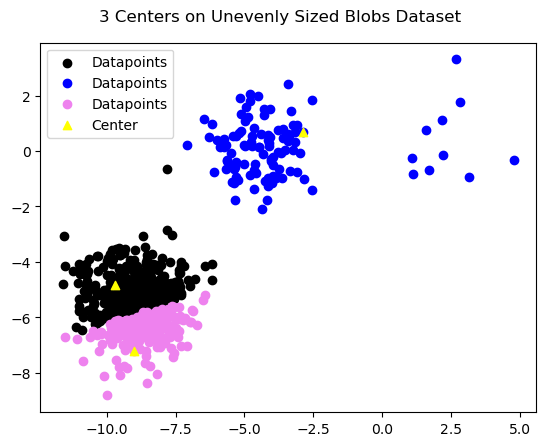

Difference of center to last run: 3.364708314928947


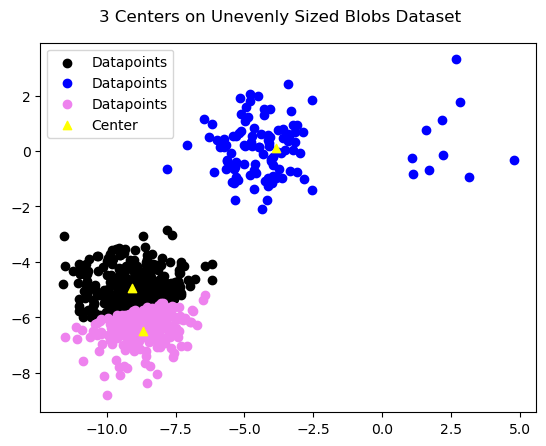

Difference of center to last run: 0.29931153518188053
1 IterationSteps untl convertion


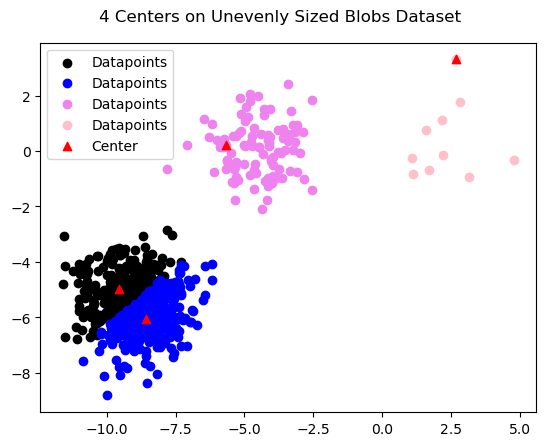

Difference of center to last run: 4.880956535676375


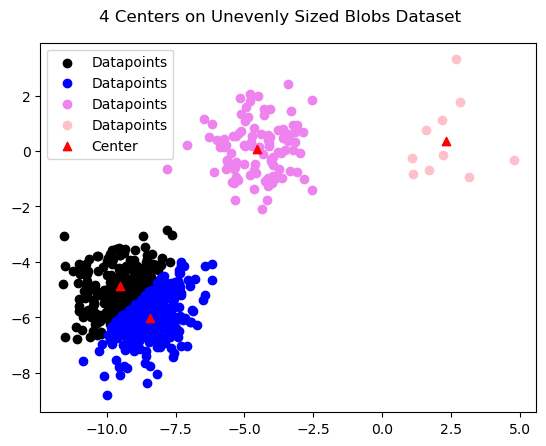

Difference of center to last run: 0.1464377624514661
1 IterationSteps untl convertion


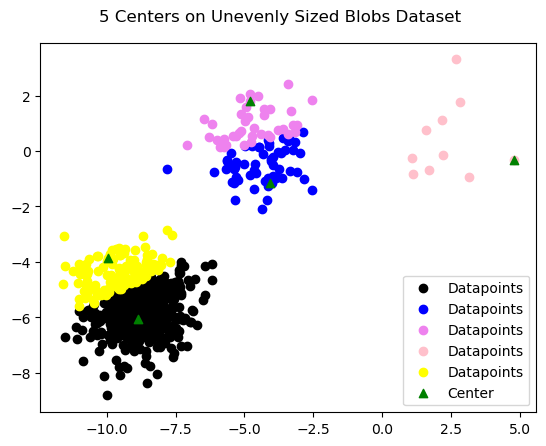

Difference of center to last run: 6.237406532021254


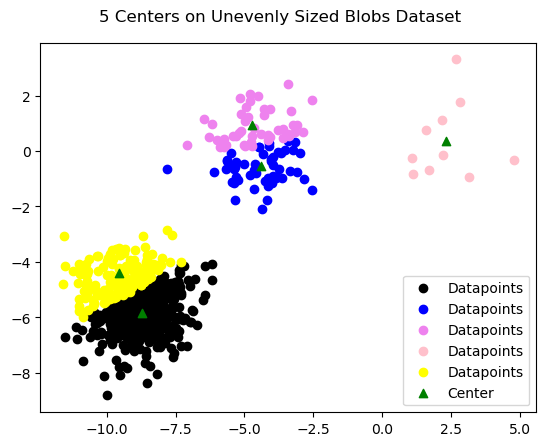

Difference of center to last run: 0.6301844507107065


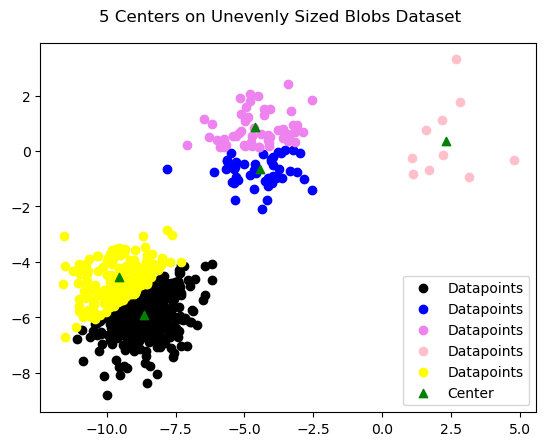

Difference of center to last run: 0.58783708518585


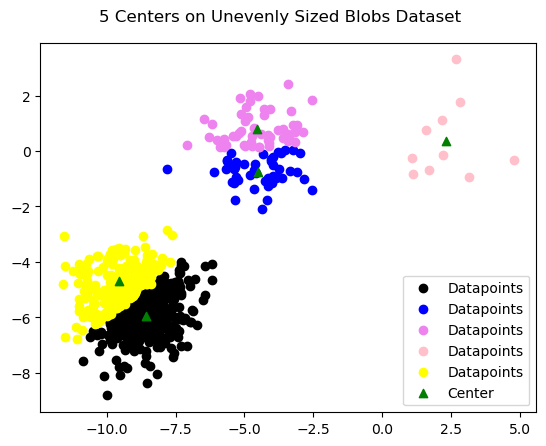

Difference of center to last run: 0.25483771205419625
3 IterationSteps untl convertion


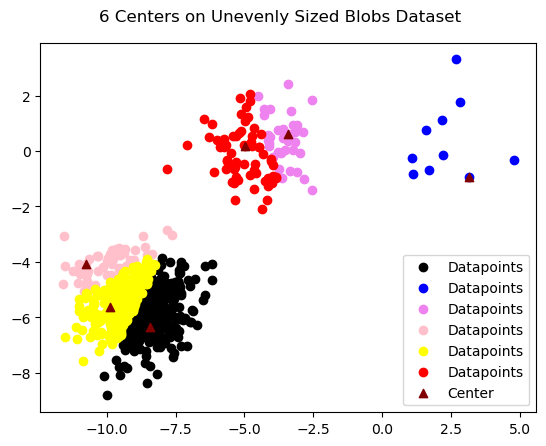

Difference of center to last run: 4.923178758550336


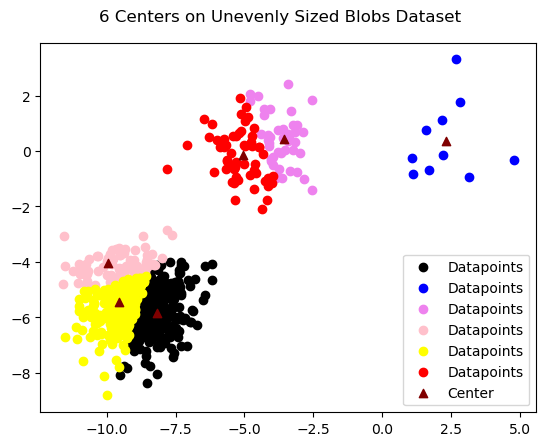

Difference of center to last run: 1.396122983619649


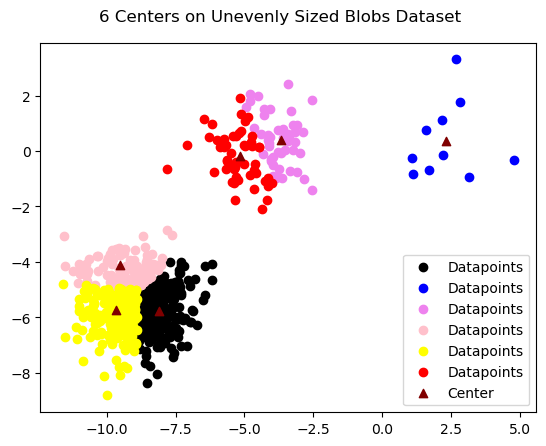

Difference of center to last run: 0.8650806746449066


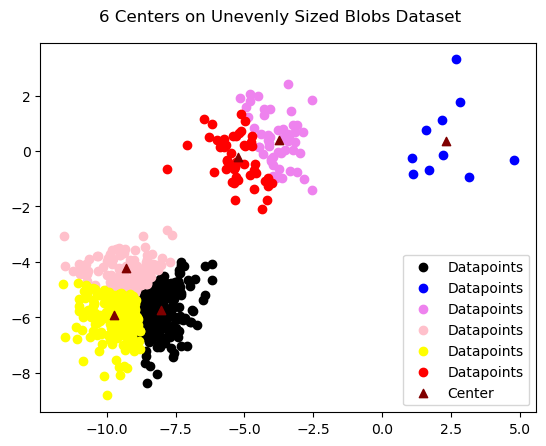

Difference of center to last run: 0.5659522293374859


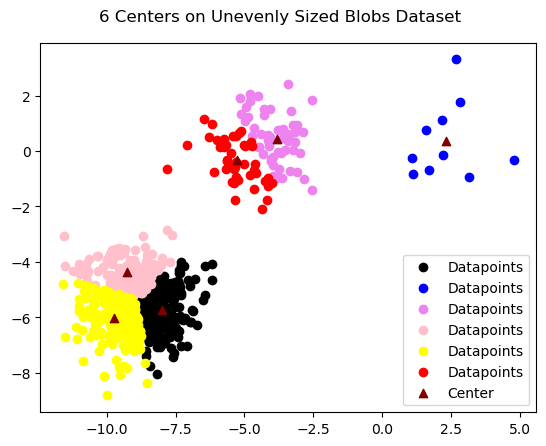

Difference of center to last run: 0.38570442465608645
4 IterationSteps untl convertion


In [7]:
#run lloyds algorithem and initialize cluster centers k++
LloydForAllCenters(X,6, "Mixture of Gaussian Blobs", kpp = True)
LloydForAllCenters(X_aniso,6, "Anisotropically Distributed Blobs", kpp = True)
LloydForAllCenters(X_varied,6, "Unequal Variance", kpp = True)
LloydForAllCenters(X_filtered,6, "Unevenly Sized Blobs", kpp = True)